In [430]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cmaps
from matplotlib.colors import LogNorm
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import cartopy.feature as cfea

In [431]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 1
    #
    # region
    one = 138
    two = 141
    three = 34
    four = 37
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [445]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 29
    #
    # region
    one = -3
    two = 1
    three = 50
    four = 53
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [450]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 20
    #
    # region
    one = 0
    two = 6
    three = 46
    four = 52
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [ ]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 12
    #
    # region
    one = -120
    two = -116
    three = 32
    four = 36
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [451]:
def lonlat2xy(loncnt, latcnt):
    a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num = geography()
    
    if -180 <= loncnt <=180:
        lon_middle = int(((loncnt+180)/360)*b )
        lat_middle = int(((90-latcnt)/180)*a ) 
    else:
        lon_middle = 1e20
        lat_middle = 1e20
    
    return lon_middle, lat_middle

In [452]:
def draw_mask(mask_temp, pop_temp, city_index, loop_num, maximum_value):
    # get city lonlat
    a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num = geography()

    # crop
    mask_cropped = mask_temp[upperindex:lowerindex, leftindex:rightindex]
    
    # pop
    pop_cropped = pop_temp[upperindex:lowerindex, leftindex:rightindex]
    
    # josui
    josui_path = f"/home/kajiyama/H08/takahashi/jyousui_20240109.csv"
    josui = pd.read_csv(josui_path)
    
    # regionalize
    josui_array = np.zeros((a, b))
    # 
    for i in range(len(josui['lon'])):
        lon_middle, lat_middle = lonlat2xy(josui['lon'][i], josui['lat'][i])
        # missing value in csv
        if lon_middle >= b or lat_middle >= a:
            continue
        else:
            josui_array[lat_middle, lon_middle] = 1
    #        
    josui_cropped = josui_array[upperindex:lowerindex, leftindex:rightindex]
    josui_masked = np.ma.masked_where(josui_cropped==0, josui_cropped)

    # extent
    projection = ccrs.PlateCarree()

    # figure
    fig = plt.figure(figsize=(10,10))
    ax = plt.subplot(projection=projection)
    ax.coastlines()
    ax.set_extent(img_extent)
    ax.gridlines(draw_labels=True)
    im = ax.imshow(pop_cropped,
                   origin='upper',extent=img_extent, transform=projection, cmap='gist_heat_r',
                  )
    #
    seethrough = np.ma.masked_where(mask_cropped == 0, mask_cropped)
    seethrough[-1, -1] = 0
    im2 = ax.imshow(seethrough,
                    origin='upper',extent=img_extent, transform=projection, cmap='gray_r'
                   )
    # 
    josui_cmap = plt.cm.colors.ListedColormap(['white', 'blue'])
    im3 = ax.imshow(josui_masked, 
                    origin='upper', cmap=josui_cmap, vmin=0, vmax=1, extent=img_extent,  transform=projection, zorder=3)
    im4 = ax.scatter(josui['lon'], josui['lat'], color='green', s=5, zorder=4)
    
    # save figure
    gif_path = f'./gifs/{loop_num:08}.jpg'
    plt.title(f"maximum population density {maximum_value} / km2")
    #plt.savefig(gif_path)
    plt.show()

In [453]:
def explore_citymask(index):

    #-----------------------------------------------
    # Initialization
    #-----------------------------------------------

    # map data
    MAP='CAMA'

    # explore grid radius
    radius_max = 12

    # search radius (1grid in 0.5degree)
    circle = 3

    # lower limitation of population density
    # if lowlim>=1e-9, tokyo mask looks like doi & kato's result
    lowlim = 1

    # initial grid threshold
    threshold = 100

    # shape
    lat_shape = 2160
    lon_shape = 4320

    # date type
    dtype= 'float32'

    # h08 directory
    h08dir = '/home/kajiyama/H08/H08_20230612'

    # initialize variables
    best_coverage = float('inf')
    best_mask = None
    best_masked_pop = None

    #-----------------------------------------------
    # load true data (UN city list) unit=[1000person]
    #-----------------------------------------------

    # true population and city name
    un_pop_list = []
    name_list = []

    # load data
    city_path = h08dir + '/map/dat/cty_lst_/city_list03.txt'
    for l in open(city_path).readlines():
        data = l[:-1].split('	')
        un_pop_list.append(int(data[4]))
        name_list.append(data[5])

    # get true UN city population
    un_pop = un_pop_list[index-1]*1000

    # get city name
    city_name = name_list[index-1]

    #-----------------------------------------------
    #  Get area(m2)
    #-----------------------------------------------

    area_path = f'{h08dir}/map/dat/lnd_ara_/lndara.{MAP}.gl5'
    area = np.fromfile(area_path, dtype=dtype).reshape(lat_shape, lon_shape)

    #-----------------------------------------------
    # load gwp population data
    #-----------------------------------------------

    # population data(GWP4 2000)
    pop_path = f'{h08dir}/map/dat/pop_tot_/C05_a___20000000.gl5'
    gwp_pop = np.fromfile(pop_path, dtype=dtype).reshape(lat_shape, lon_shape)

    # population density (person/km2)
    gwp_pop_density = (gwp_pop / (area / 10**6))

    #-----------------------------------------------
    # load city_center coordinate
    #-----------------------------------------------

    center_path = f'{h08dir}/map/dat/cty_cnt_/city_{index:08d}.gl5'
    location = np.fromfile(center_path, dtype=dtype).reshape(lat_shape,lon_shape)
    x = np.where(location==1)[0]
    y = np.where(location==1)[1]
    x = x[0]
    y = y[0]

    #-----------------------------------------------
    # check city center
    #-----------------------------------------------

    # original city center
    org_cnt = gwp_pop[x, y]

    # number of replacement
    replaced_num = 0

    # if there is larger grid, center grid is replaced
    for a in range(x-circle, x+circle+1):
        for b in range(y-circle, y+circle+1):
            candidate = gwp_pop[a, b]
            if candidate >= org_cnt:
                org_cnt = candidate
                x = a
                y = b
                replaced_num += 1

    #-----------------------------------------------
    #  Initialization of mask array
    #-----------------------------------------------

    # mask array for saving
    mask = np.zeros((lat_shape,lon_shape), dtype=dtype)
    mask[x, y] = 1

    #-----------------------------------------------
    #  Explore start
    #-----------------------------------------------

    # stop flag
    new_mask_added = True
    coverage_flag = True

    # city center
    best_mask = mask
    grid_num = np.sum(best_mask)
    best_masked_pop = np.sum(gwp_pop*mask)
    best_coverage = float(best_masked_pop / un_pop)

    # initial grid threshold
    if gwp_pop_density[x, y] <= threshold:
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        print(f"initial density {gwp_pop_density[x, y]} less than threshold {threshold}")
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        new_maske_added = False
        coverage_flag = False

    # loop start
    loop_num = 0
    while new_mask_added:

        ### make search list
        search_lst = []
        new_mask_added = False
        for a in range(max(0, x - radius_max), min(x + radius_max + 1, lat_shape)):
            for b in range(max(0, y - radius_max), min(y + radius_max + 1, lon_shape)):
                if mask[a, b] == 1:
                    # explore surrounded 8 grids
                    for dx, dy in [(-1, 0), (-1, 1), (0, 1), (1, 1), (1, 0), (1, -1), (0, -1), (-1, 1)]:
                        i, j = a + dx, b + dy
                        # not explored yet
                        if mask[i, j] == 0:
                            # within grid range
                            if 0 <= i < lat_shape and 0<= j < lon_shape:
                                search_lst.append([gwp_pop_density[i, j], i, j])

        ### add searched grid
        # empty check
        if not search_lst:
            new_mask_added = False
            coverage_flag = False
        # get largest grid
        else:
            
            sorted_search = sorted(search_lst, key=lambda x: x[0], reverse=True)
            largest = sorted_search[0]
            # if largest grid value is too small, stop exploring
            if gwp_pop_density[largest[1], largest[2]] <= lowlim:
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                print(f"largest density {gwp_pop_density[largest[1], largest[2]]} smaller than lowlim {lowlim}")
                print([gwp_pop_density[t[1], t[2]]for t in sorted_search])
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                new_mask_added = False
                coverage_flag = False
                
        # stop flag
        if coverage_flag is True:
                new_mask_added = True

                # evaluate coverage
                gwp_masked_pop = np.sum(mask * gwp_pop)
                coverage = float(gwp_masked_pop / un_pop)

                # stop exploring
                if coverage >= 1.0:
                    new_mask_added = False
                    coverage_flag = False

                # judge
                judge_value = abs(1 - coverage)
                best_value = abs(1 - best_coverage)
                
                # update
                if judge_value < best_value:
                    best_coverage = coverage
                    best_mask = mask
                    best_masked_pop = gwp_masked_pop
                    grid_num = np.sum(best_mask)
        
        # search_lst is colored
        for cand in search_lst:
            mask[cand[1], cand[2]] = 0.1
        # for drawing
        mask[largest[1], largest[2]] = 0.3
        
        # draw
        # cand = 0.3
        # largest = 0.6
        # citymask = 1
        maximum_value = np.round(gwp_pop_density[largest[1], largest[2]])
        draw_mask(best_mask, gwp_pop_density, index, loop_num, maximum_value)
        #new_mask_added = False # this should be removed in the future
        #coverage_flag = False # this should be removed in the future
        
        # reset
        mask[mask == 0.1] = 0
        mask[mask == 0.3] = 1
        # loop count
        loop_num += 1

        #-----------------------------------------------
        # Output result
        #-----------------------------------------------

        print('#########################################')
        print(
              f"explored_pop {best_masked_pop}\n" \
              f"true_pop {un_pop}\n" \
              f"coverage {best_coverage}\n" \
              f"city_mask {grid_num}\n" \
              f"{city_name}"
              )
        print('#########################################')

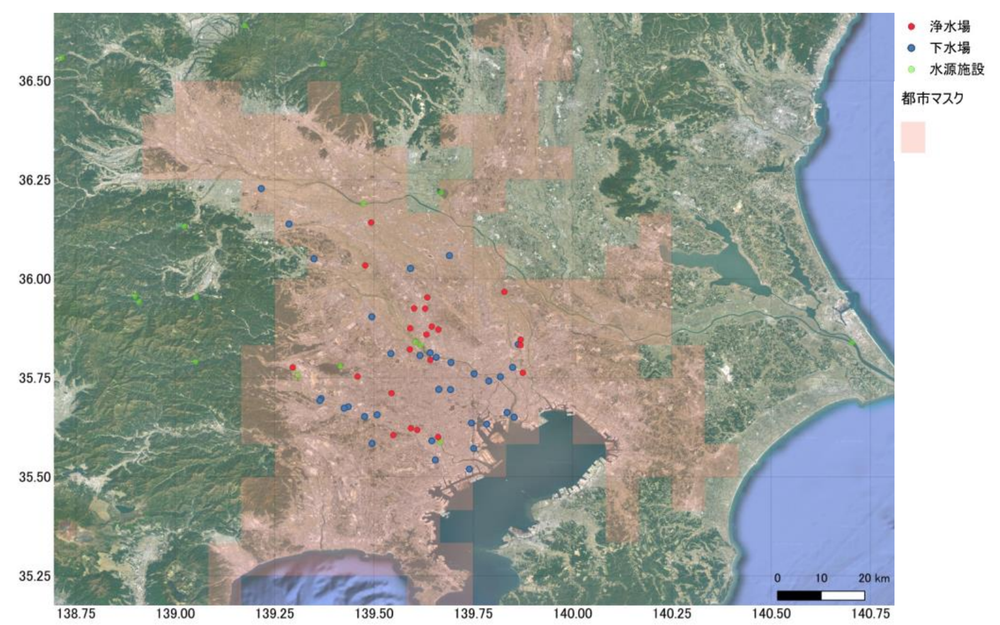

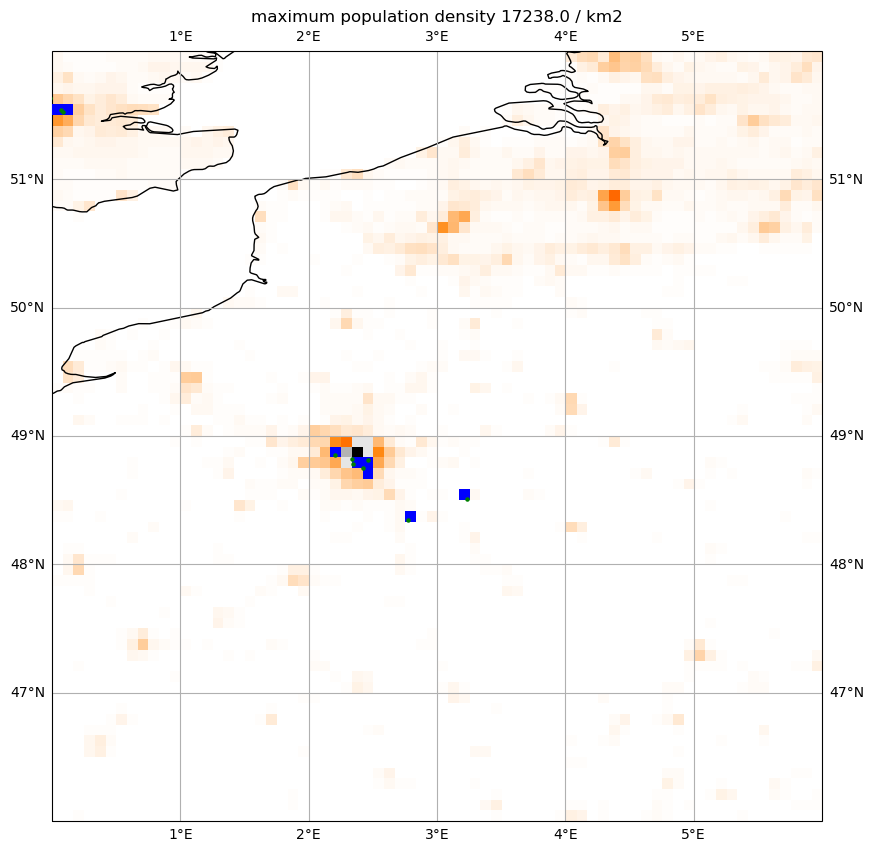

#########################################
explored_pop 1229325.0
true_pop 9737000
coverage 0.1262529526548218
city_mask 1.0
Paris
#########################################


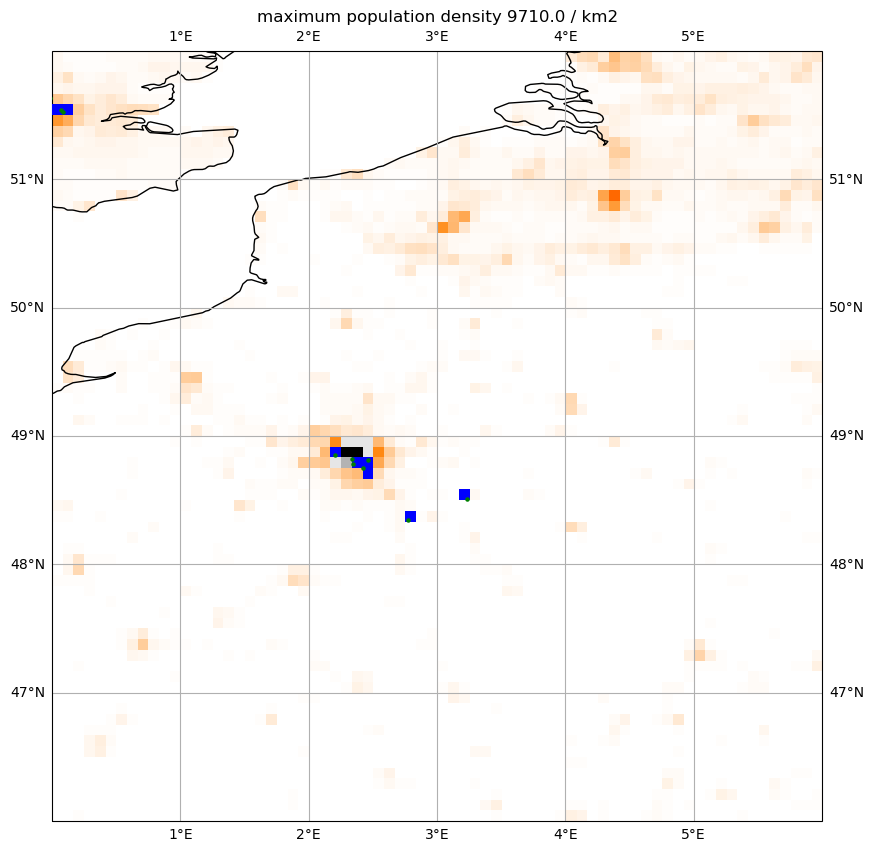

#########################################
explored_pop 2203999.5
true_pop 9737000
coverage 0.22635303481565164
city_mask 2.0
Paris
#########################################


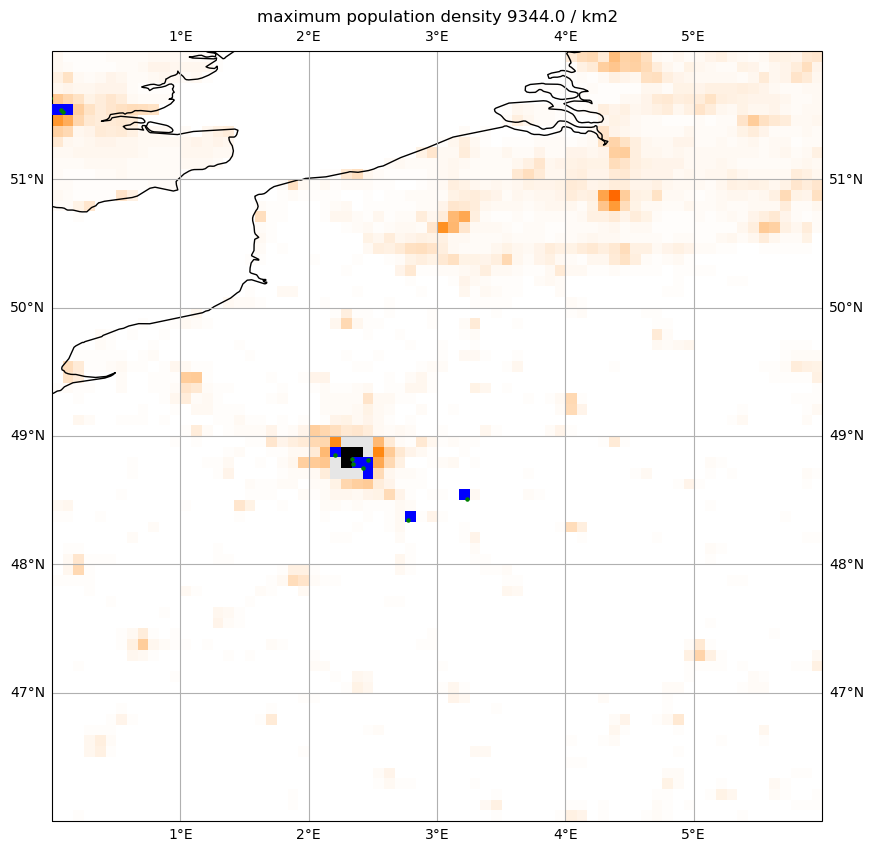

#########################################
explored_pop 2753959.0
true_pop 9737000
coverage 0.28283444592790385
city_mask 3.0
Paris
#########################################


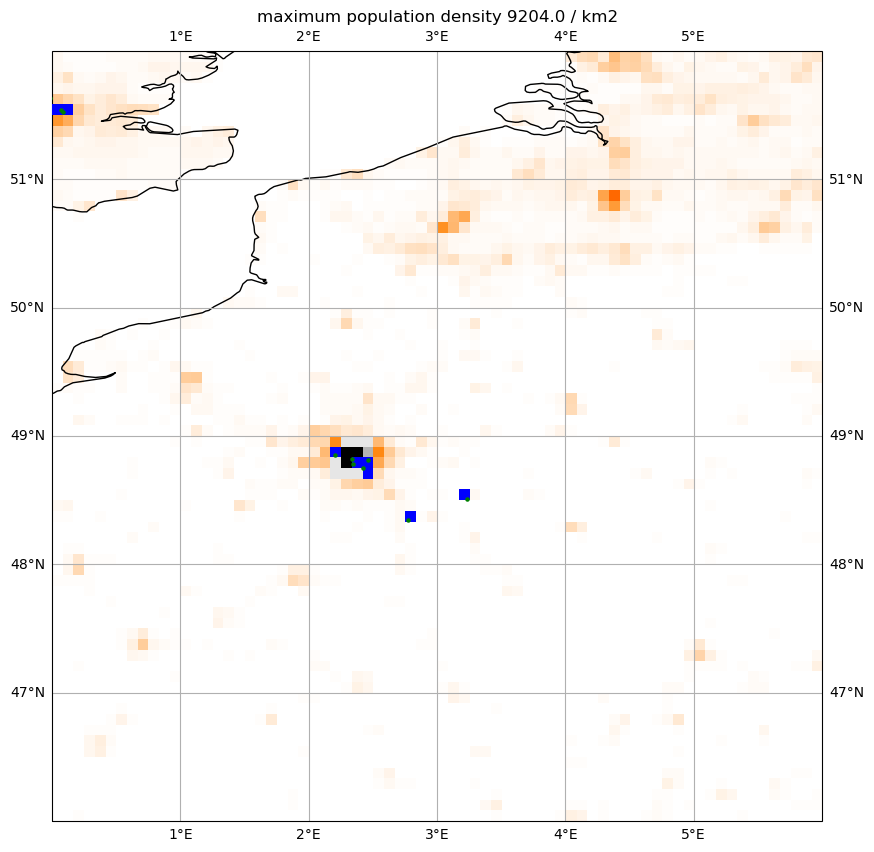

#########################################
explored_pop 3283206.0
true_pop 9737000
coverage 0.33718866180548424
city_mask 4.0
Paris
#########################################


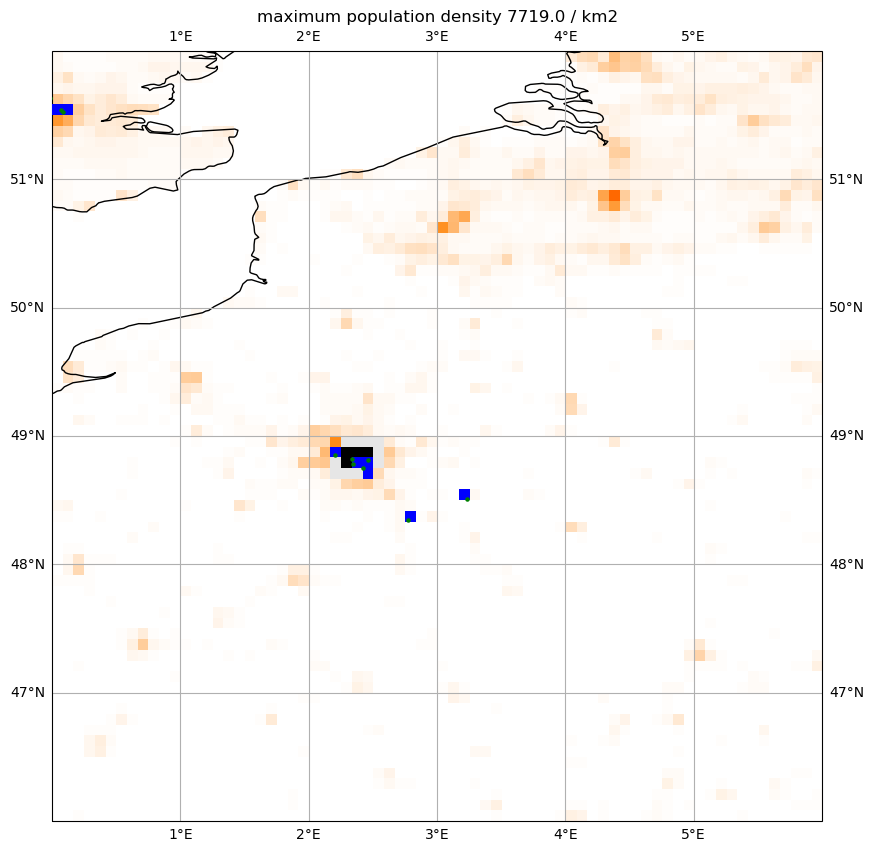

#########################################
explored_pop 3803586.0
true_pop 9737000
coverage 0.3906322275854986
city_mask 5.0
Paris
#########################################


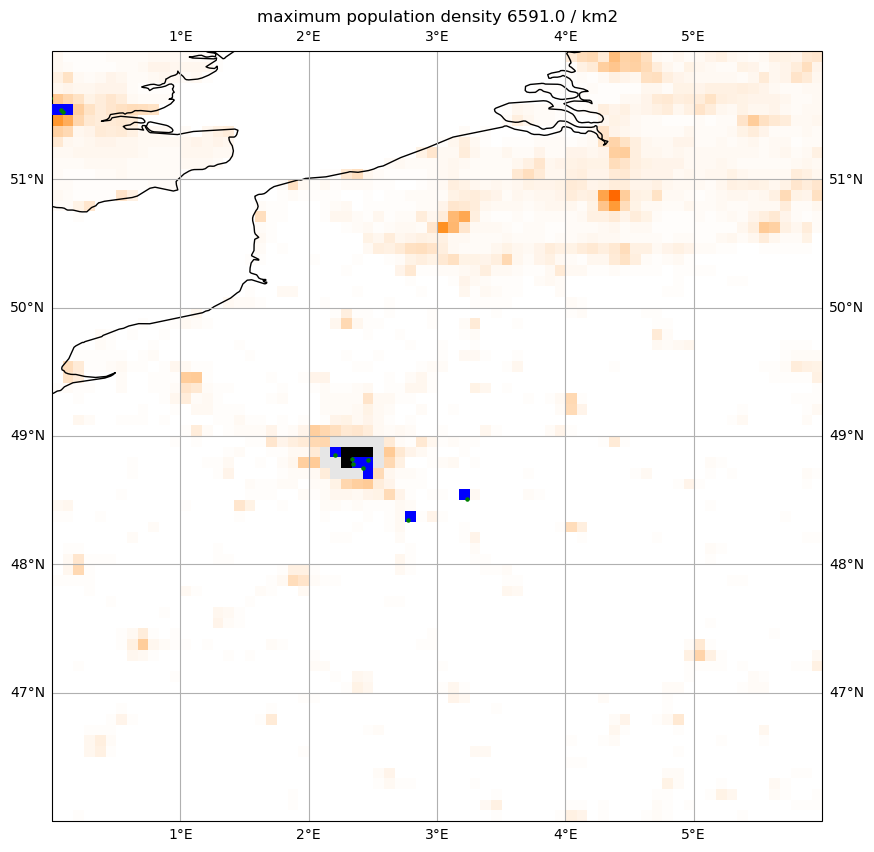

#########################################
explored_pop 4240027.0
true_pop 9737000
coverage 0.4354551709972271
city_mask 6.0
Paris
#########################################


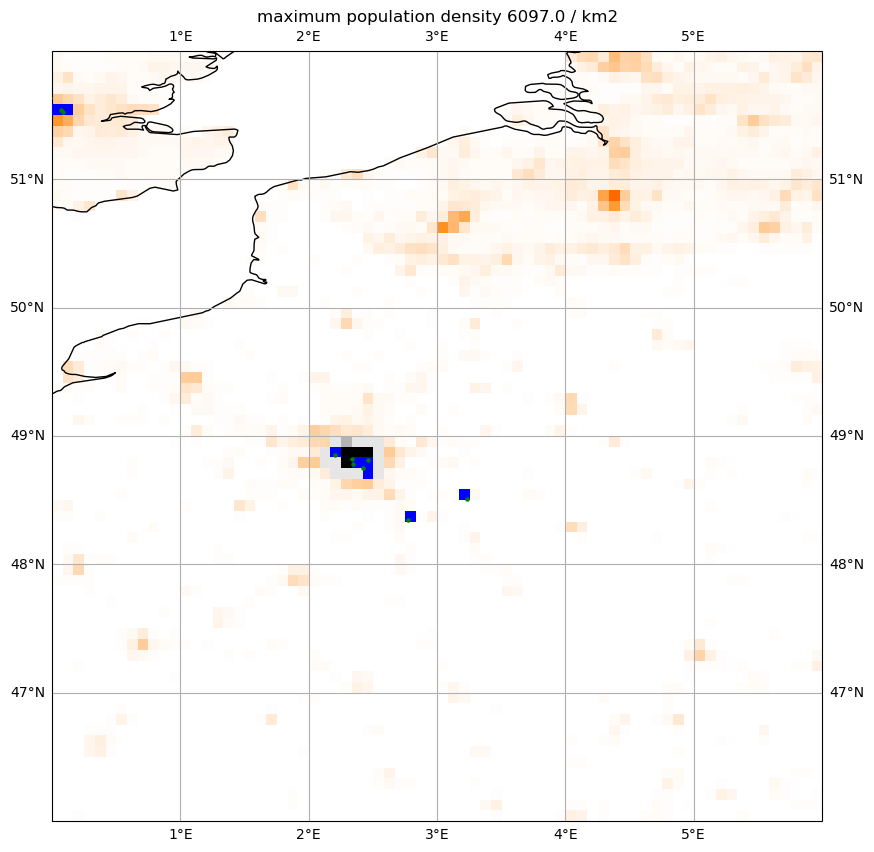

#########################################
explored_pop 4613357.0
true_pop 9737000
coverage 0.47379654924514736
city_mask 7.0
Paris
#########################################


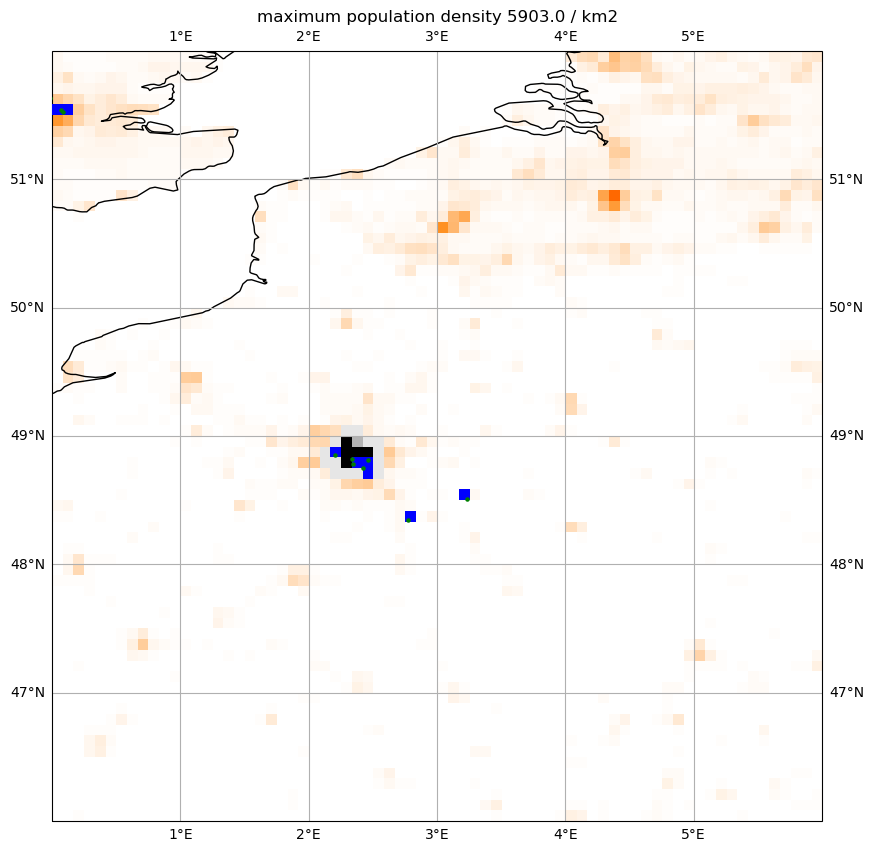

#########################################
explored_pop 4957524.5
true_pop 9737000
coverage 0.5091429084933757
city_mask 8.0
Paris
#########################################


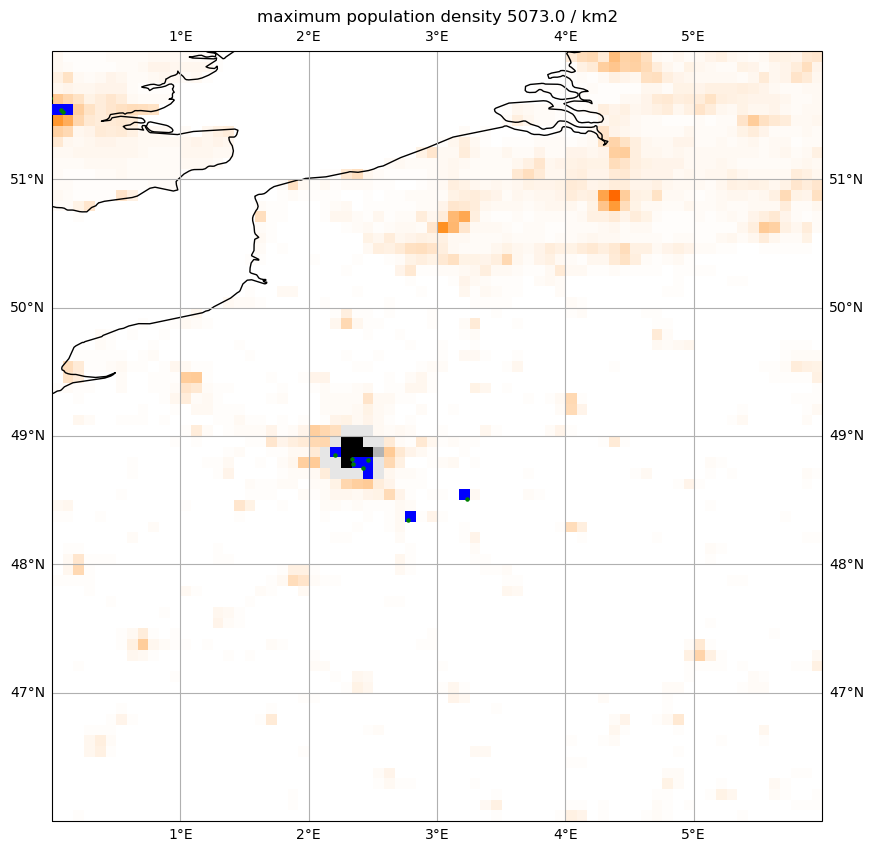

#########################################
explored_pop 5290747.0
true_pop 9737000
coverage 0.5433652048885693
city_mask 9.0
Paris
#########################################


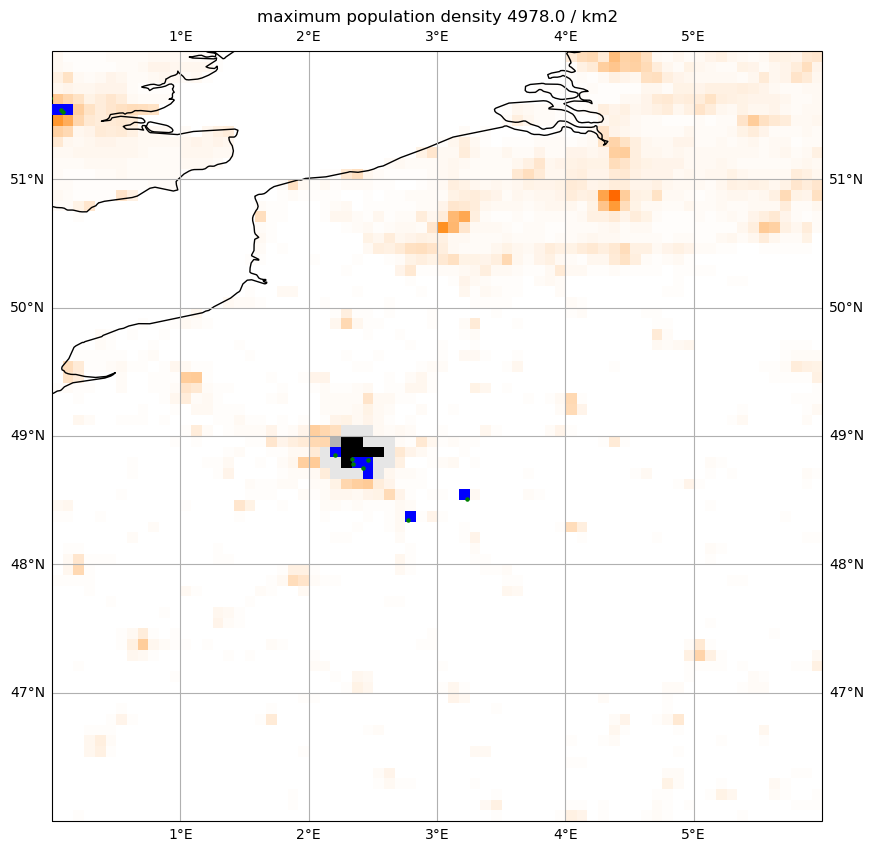

#########################################
explored_pop 5577603.0
true_pop 9737000
coverage 0.5728256136386978
city_mask 10.0
Paris
#########################################


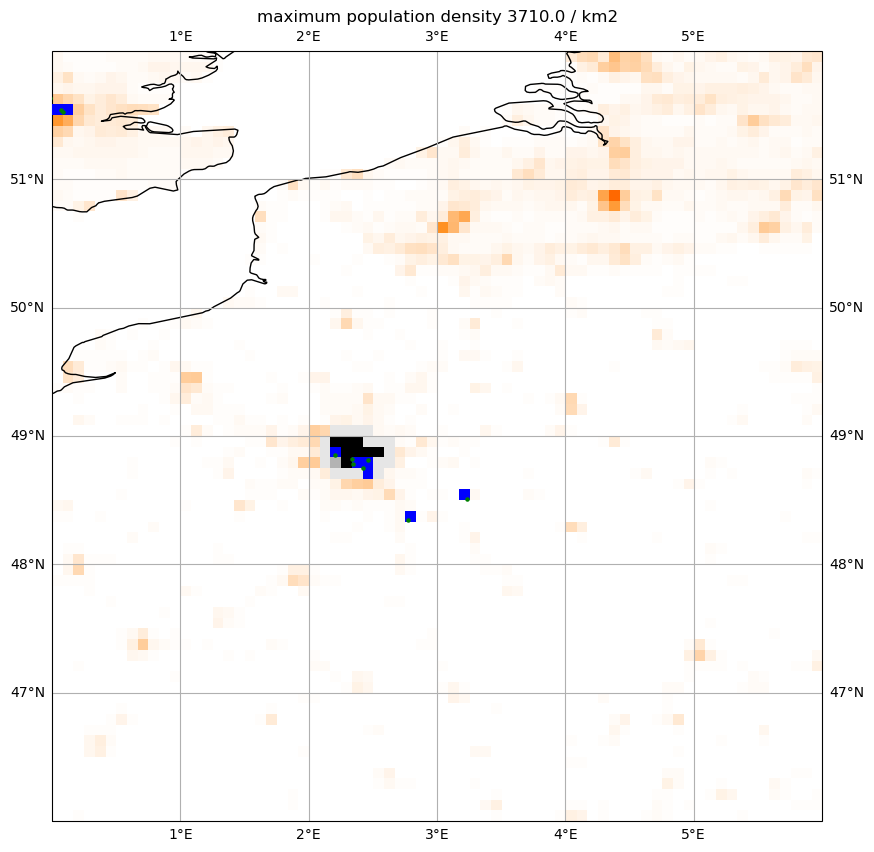

#########################################
explored_pop 5858575.0
true_pop 9737000
coverage 0.6016817294854678
city_mask 11.0
Paris
#########################################


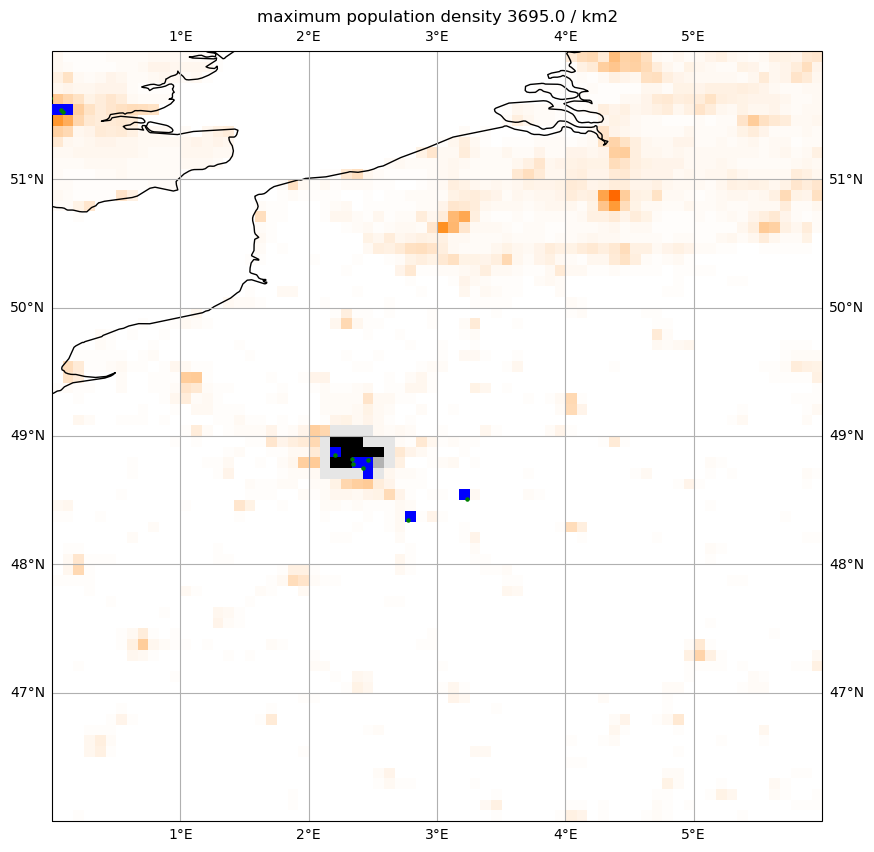

#########################################
explored_pop 6068711.0
true_pop 9737000
coverage 0.623262914655438
city_mask 12.0
Paris
#########################################


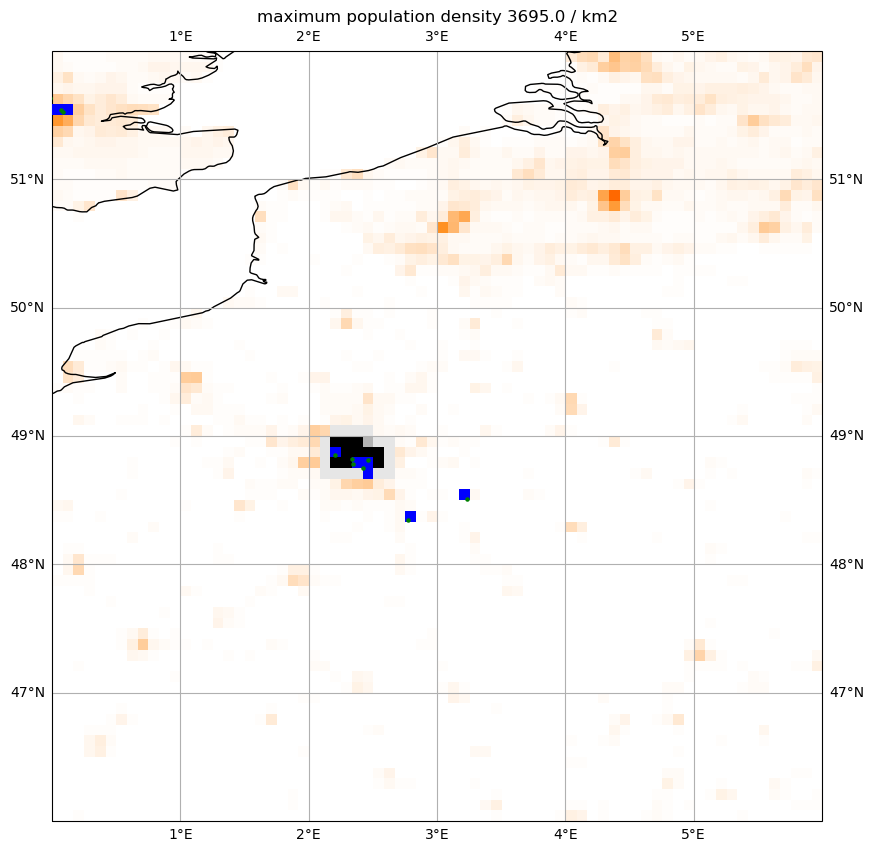

#########################################
explored_pop 6278005.0
true_pop 9737000
coverage 0.6447576255520181
city_mask 13.0
Paris
#########################################


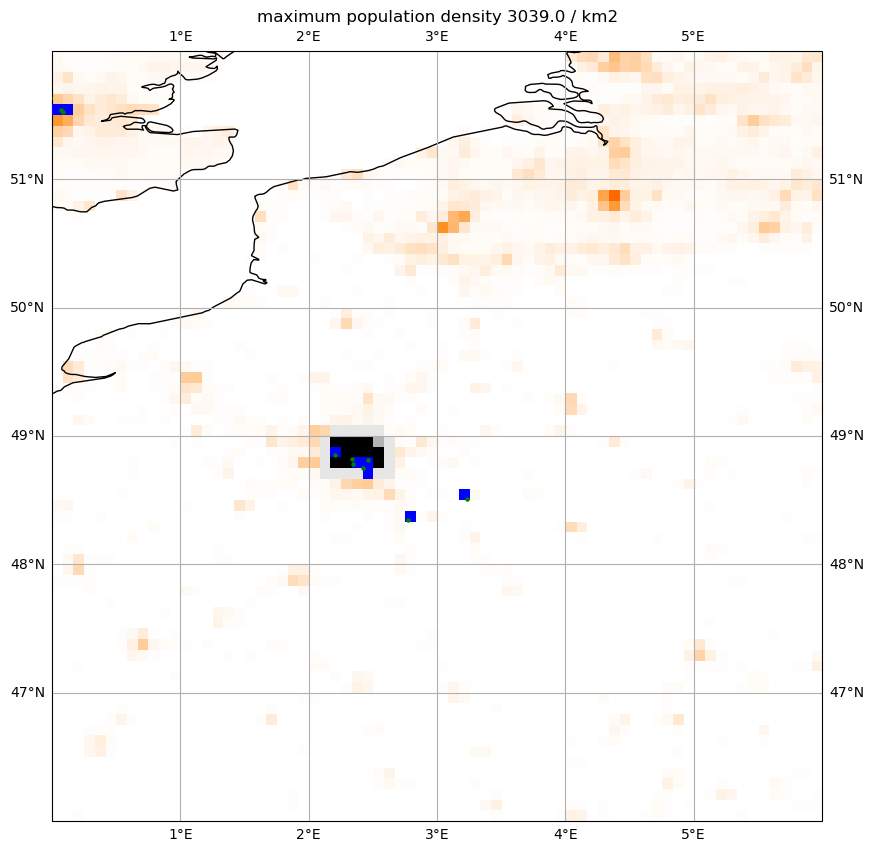

#########################################
explored_pop 6486563.0
true_pop 9737000
coverage 0.6661767484851597
city_mask 14.0
Paris
#########################################


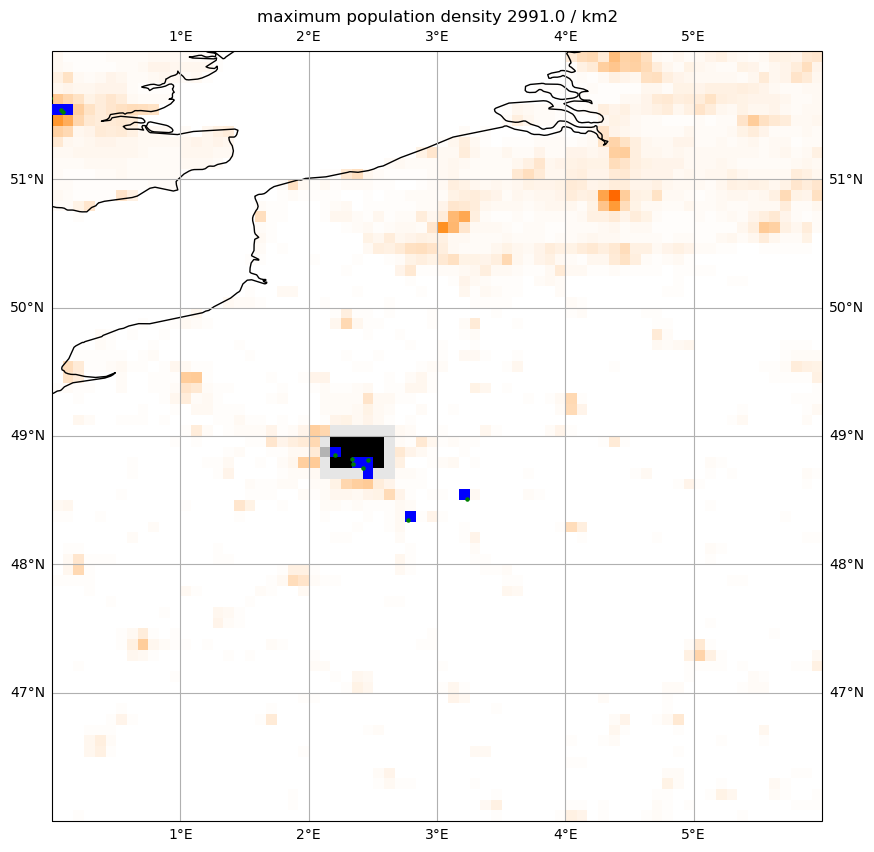

#########################################
explored_pop 6658117.0
true_pop 9737000
coverage 0.6837955222347746
city_mask 15.0
Paris
#########################################


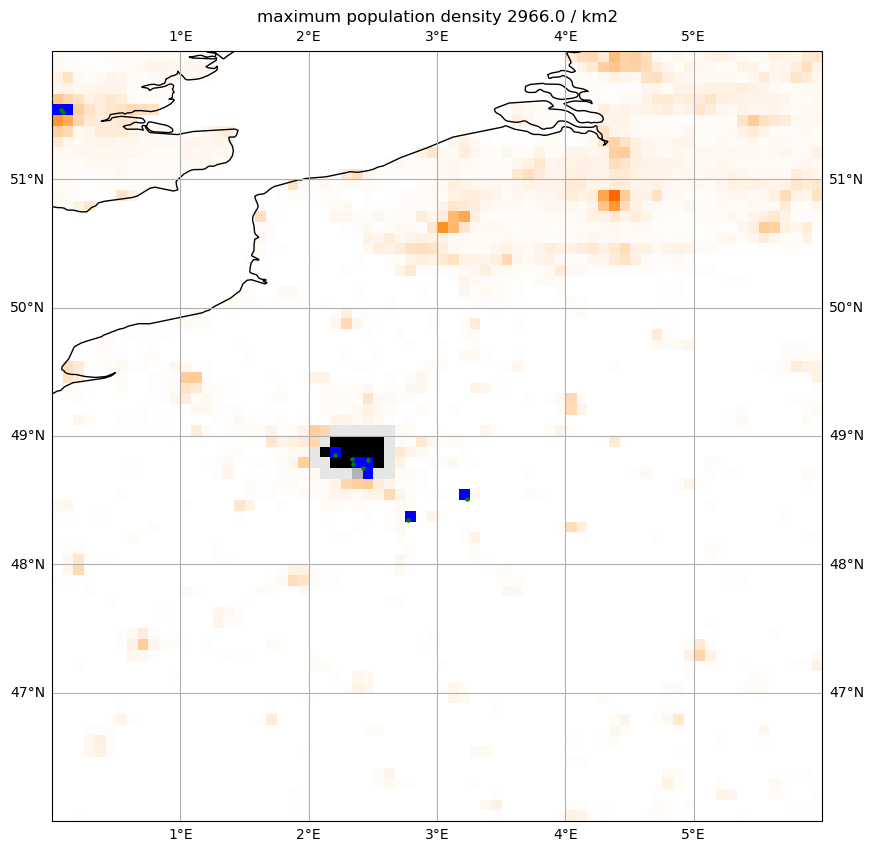

#########################################
explored_pop 6827240.0
true_pop 9737000
coverage 0.7011646297627606
city_mask 16.0
Paris
#########################################


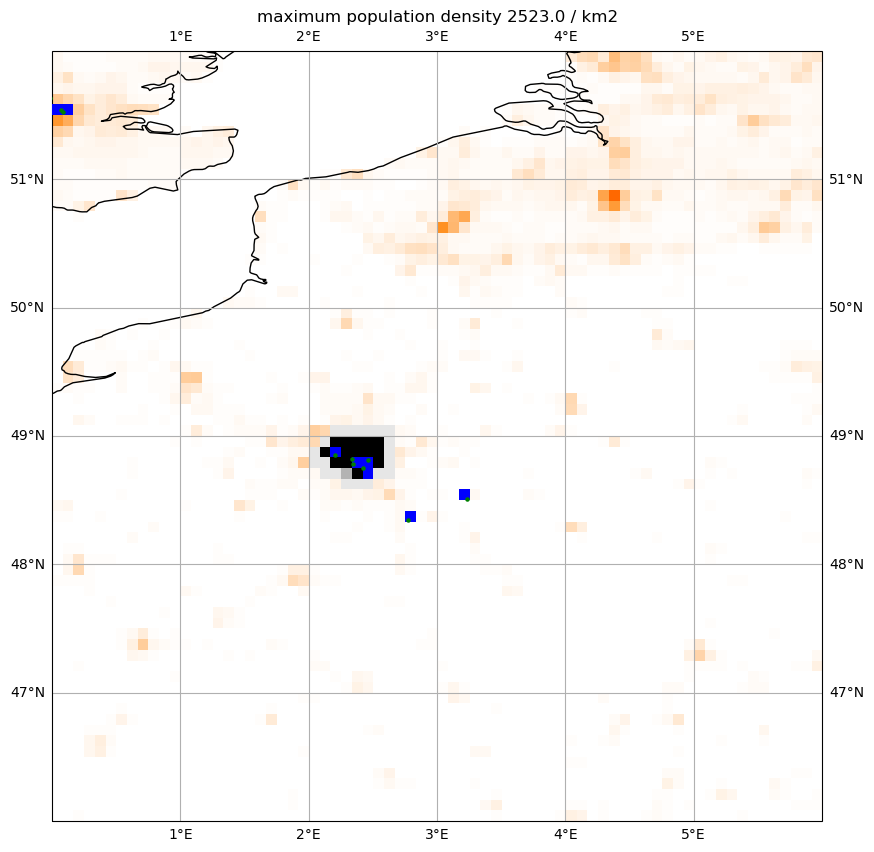

#########################################
explored_pop 6995513.5
true_pop 9737000
coverage 0.7184464927595768
city_mask 17.0
Paris
#########################################


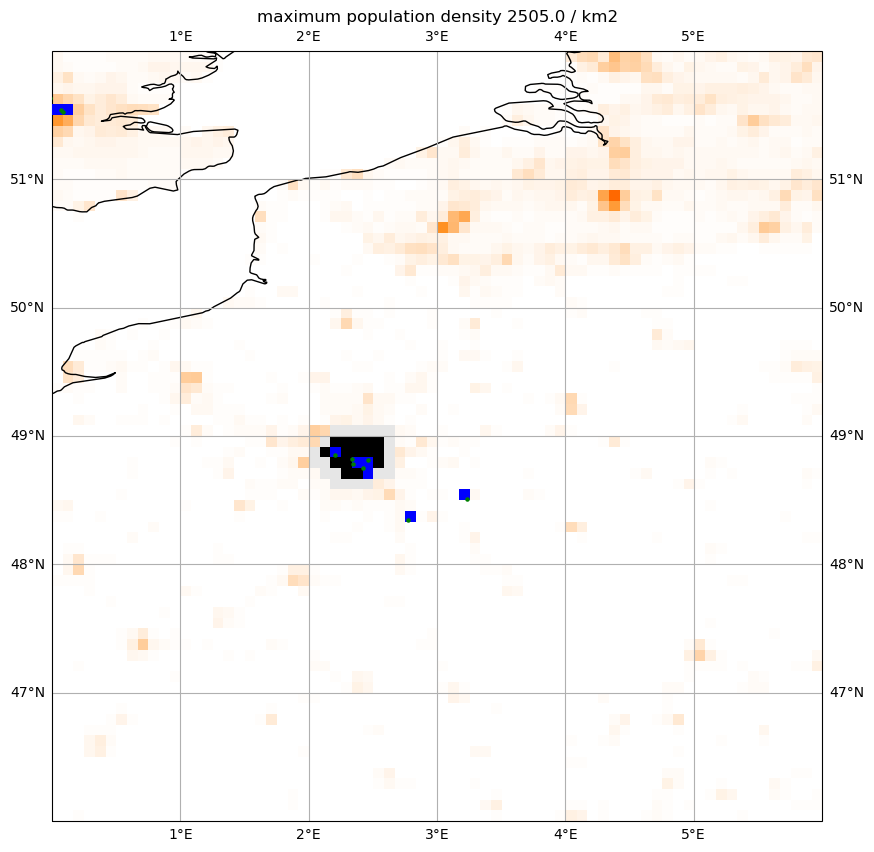

#########################################
explored_pop 7138663.0
true_pop 9737000
coverage 0.7331480948957585
city_mask 18.0
Paris
#########################################


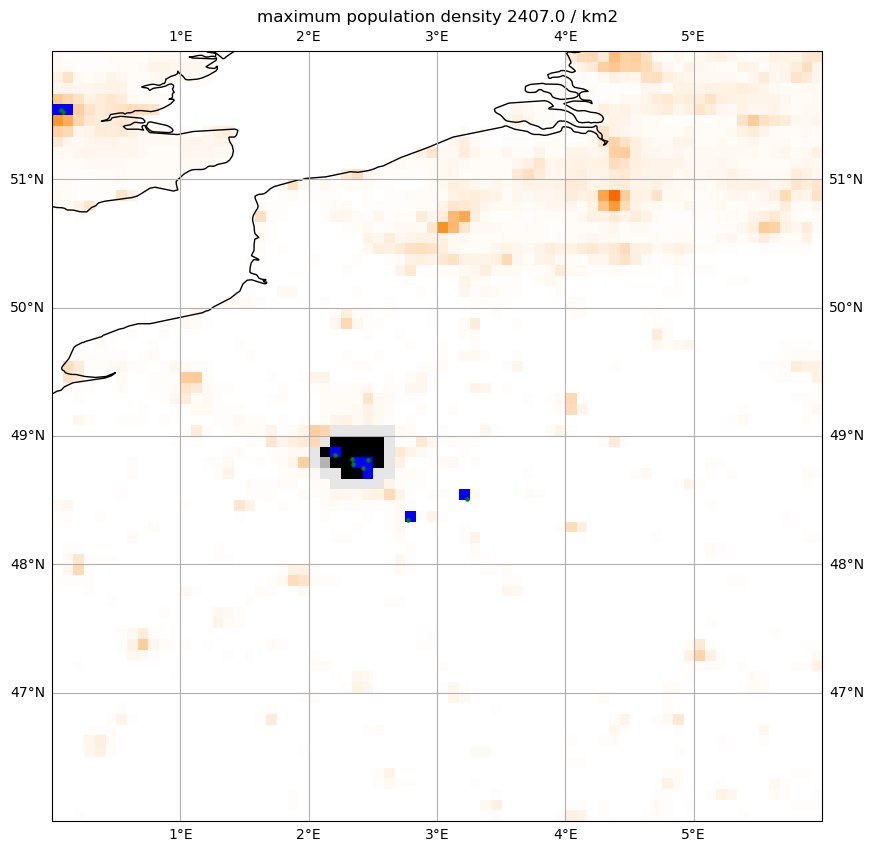

#########################################
explored_pop 7280781.0
true_pop 9737000
coverage 0.7477437609119852
city_mask 19.0
Paris
#########################################


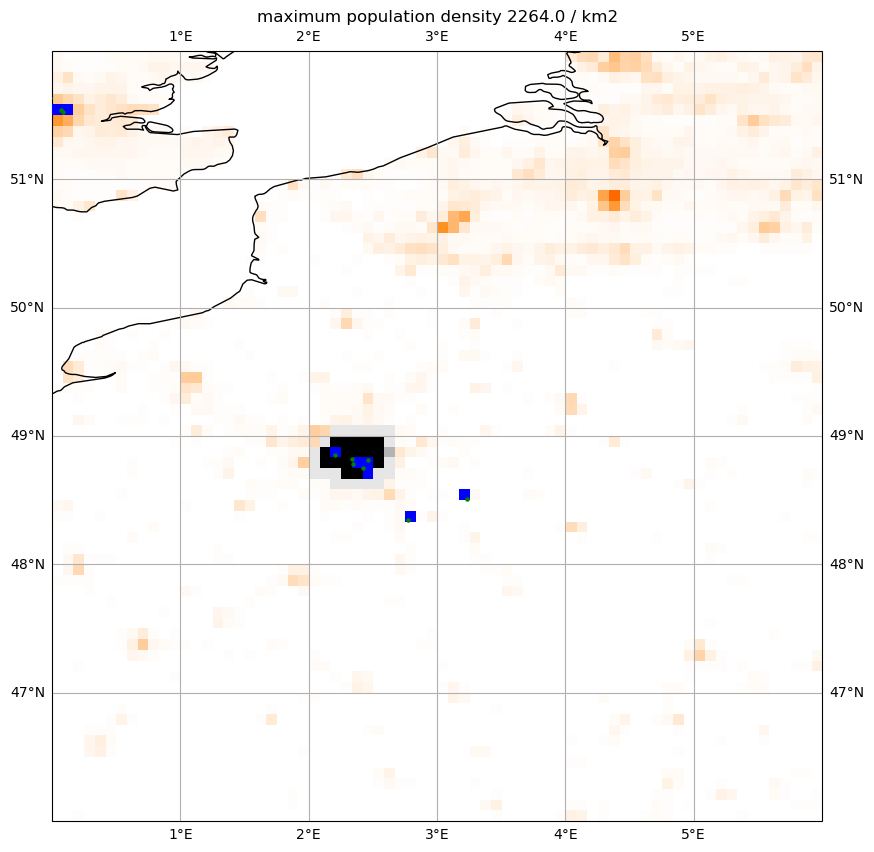

#########################################
explored_pop 7417086.5
true_pop 9737000
coverage 0.7617424771490192
city_mask 20.0
Paris
#########################################


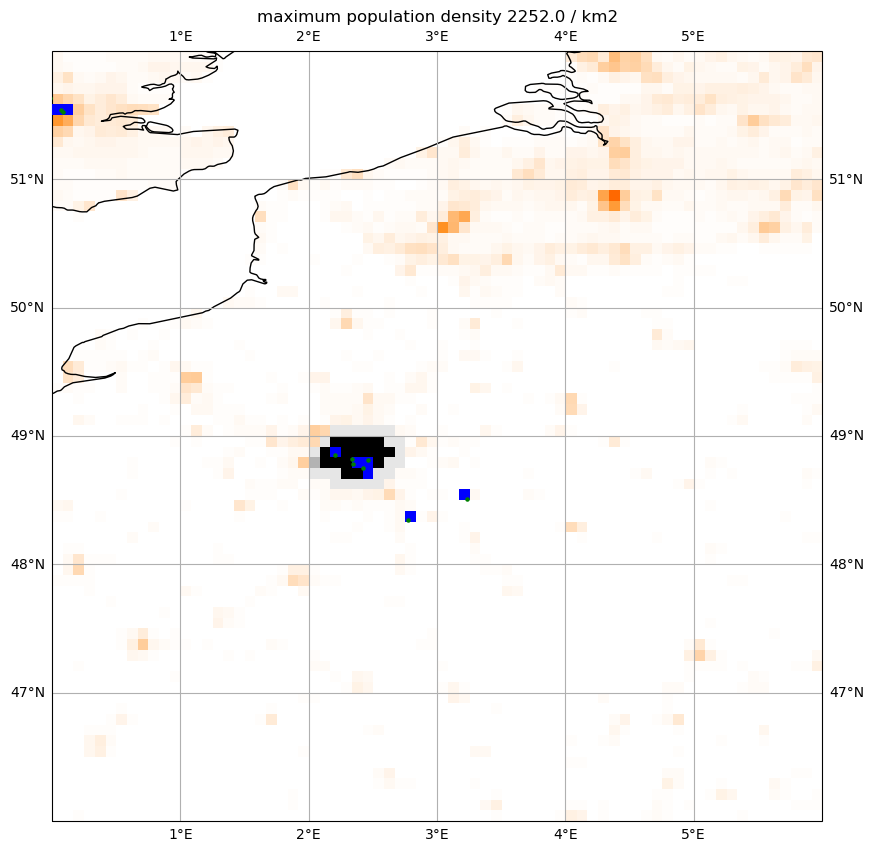

#########################################
explored_pop 7545102.0
true_pop 9737000
coverage 0.7748898017869981
city_mask 21.0
Paris
#########################################


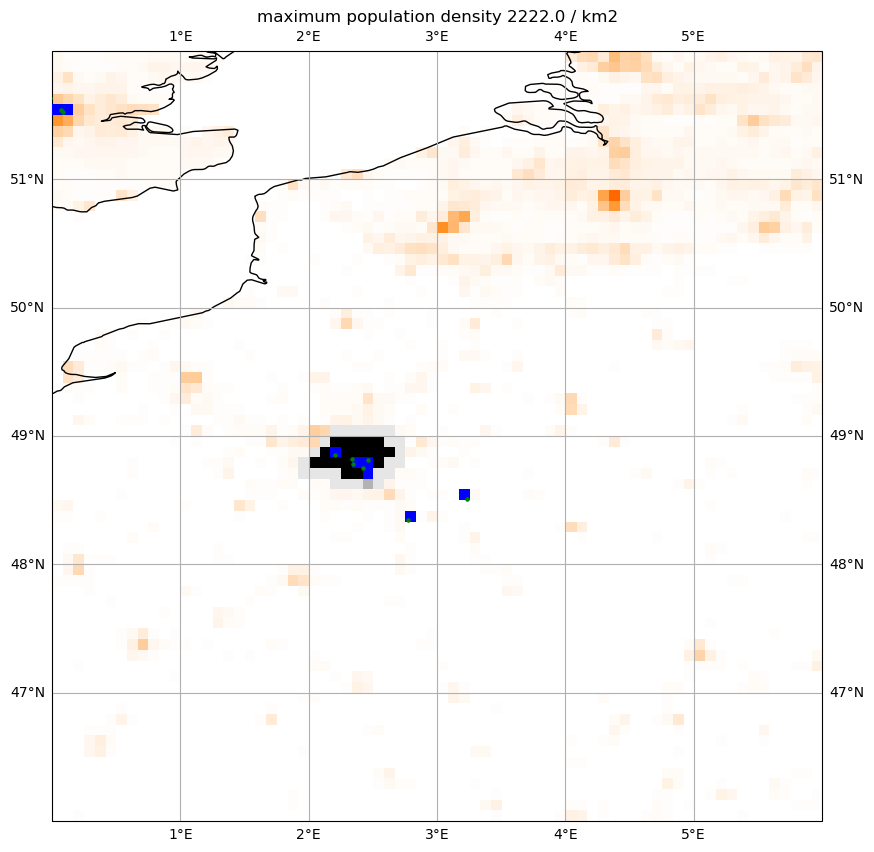

#########################################
explored_pop 7672632.0
true_pop 9737000
coverage 0.7879872650713772
city_mask 22.0
Paris
#########################################


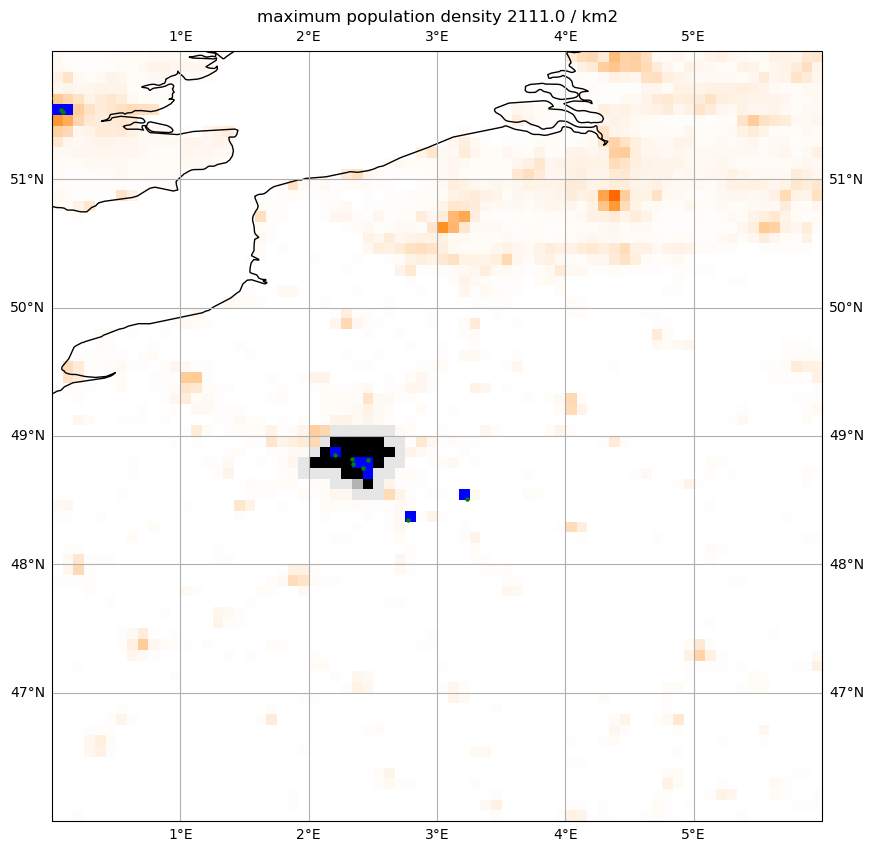

#########################################
explored_pop 7798912.0
true_pop 9737000
coverage 0.8009563520591558
city_mask 23.0
Paris
#########################################


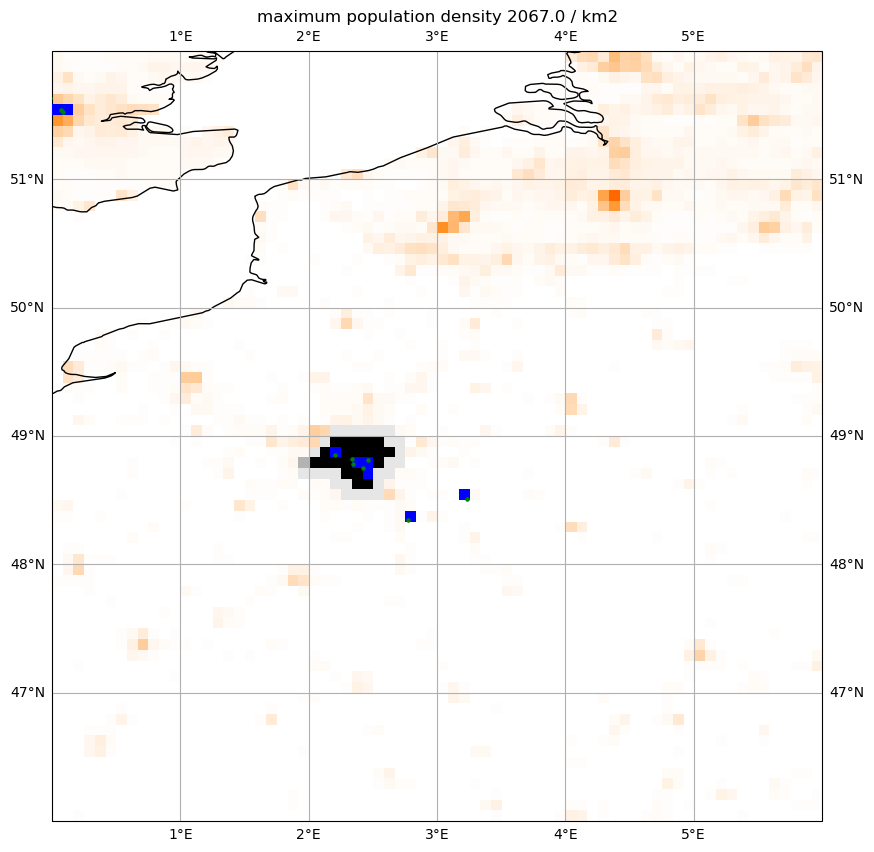

#########################################
explored_pop 7918877.0
true_pop 9737000
coverage 0.8132768819965082
city_mask 24.0
Paris
#########################################


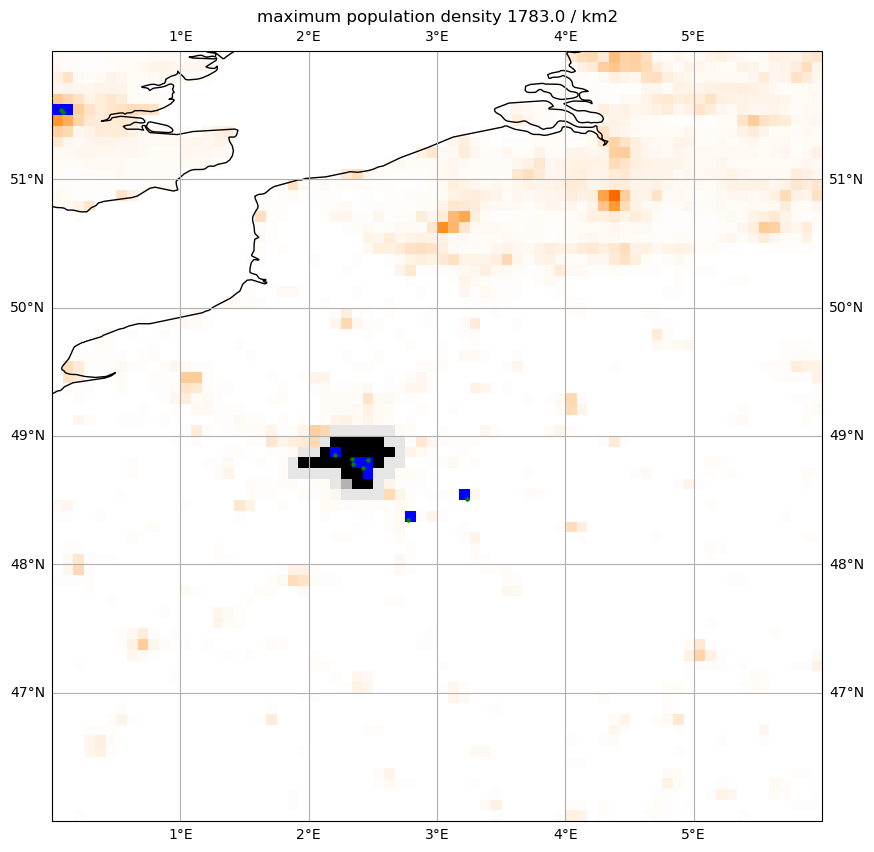

#########################################
explored_pop 8035929.0
true_pop 9737000
coverage 0.8252982438122625
city_mask 25.0
Paris
#########################################


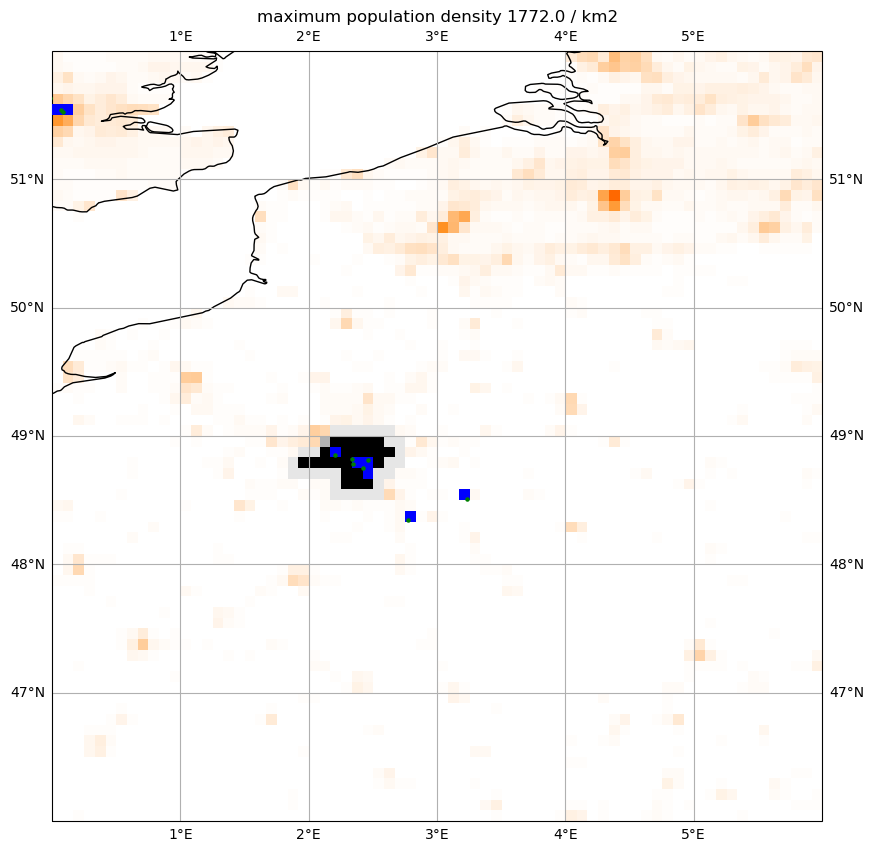

#########################################
explored_pop 8137261.0
true_pop 9737000
coverage 0.8357051453219677
city_mask 26.0
Paris
#########################################


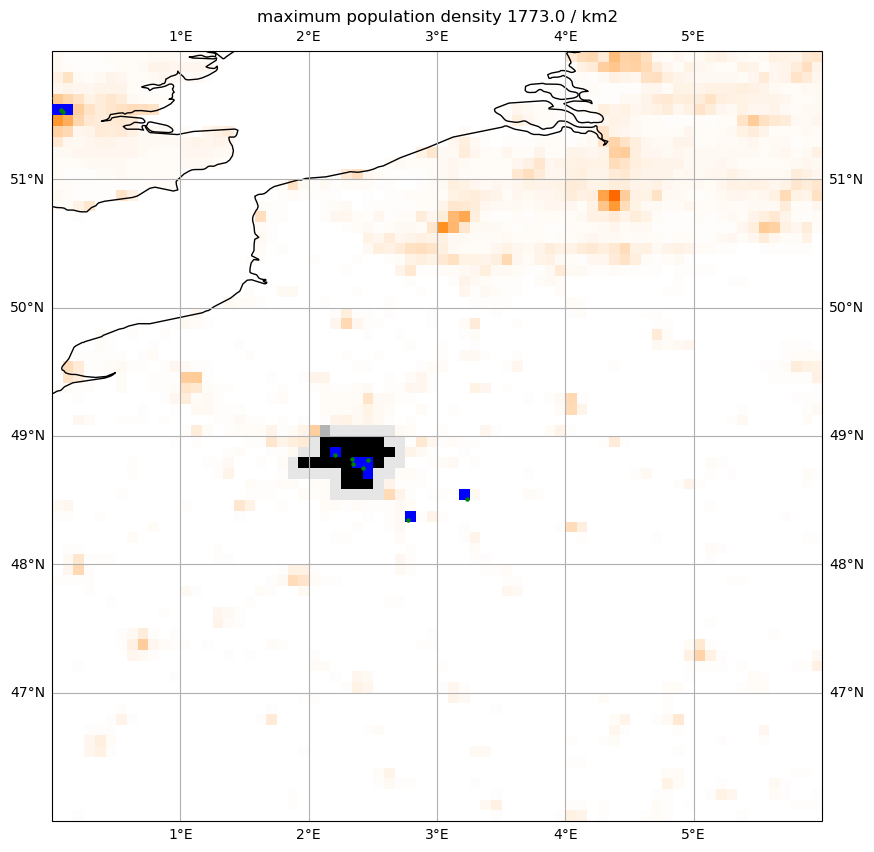

#########################################
explored_pop 8237291.5
true_pop 9737000
coverage 0.8459783814316525
city_mask 27.0
Paris
#########################################


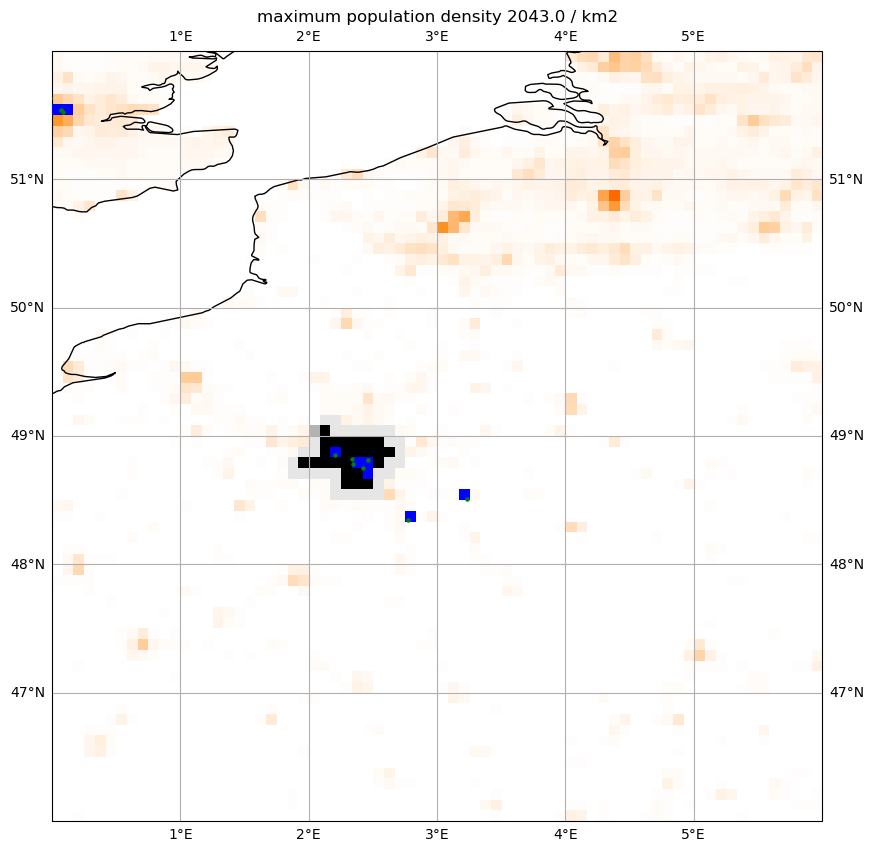

#########################################
explored_pop 8337212.0
true_pop 9737000
coverage 0.8562403204272363
city_mask 28.0
Paris
#########################################


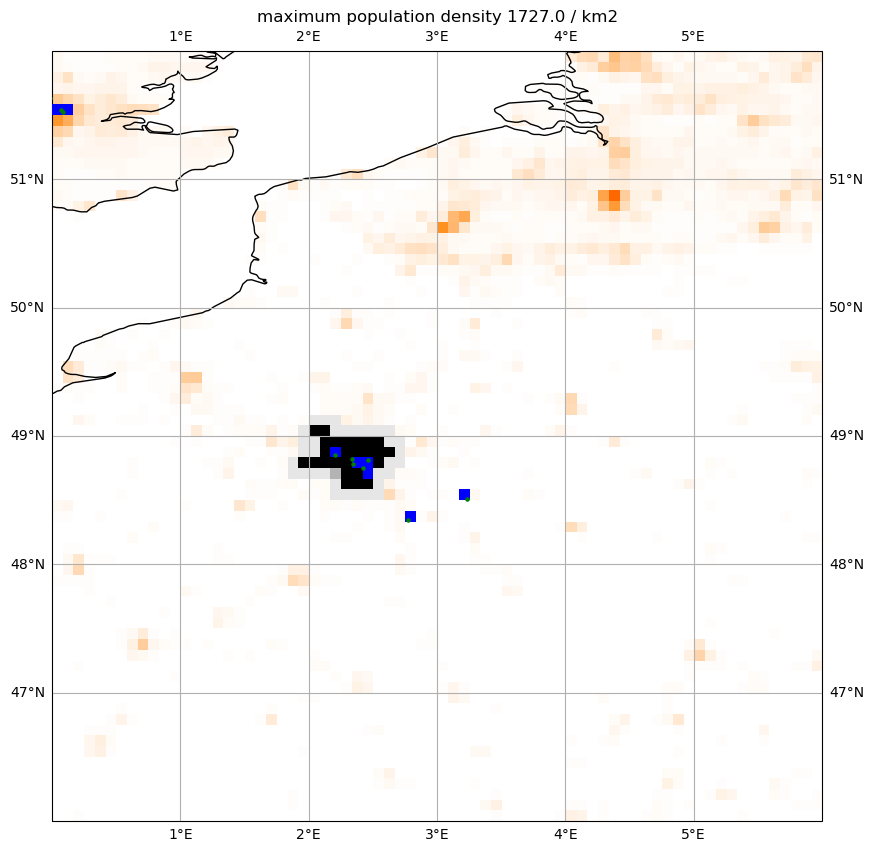

#########################################
explored_pop 8452342.0
true_pop 9737000
coverage 0.8680642908493376
city_mask 29.0
Paris
#########################################


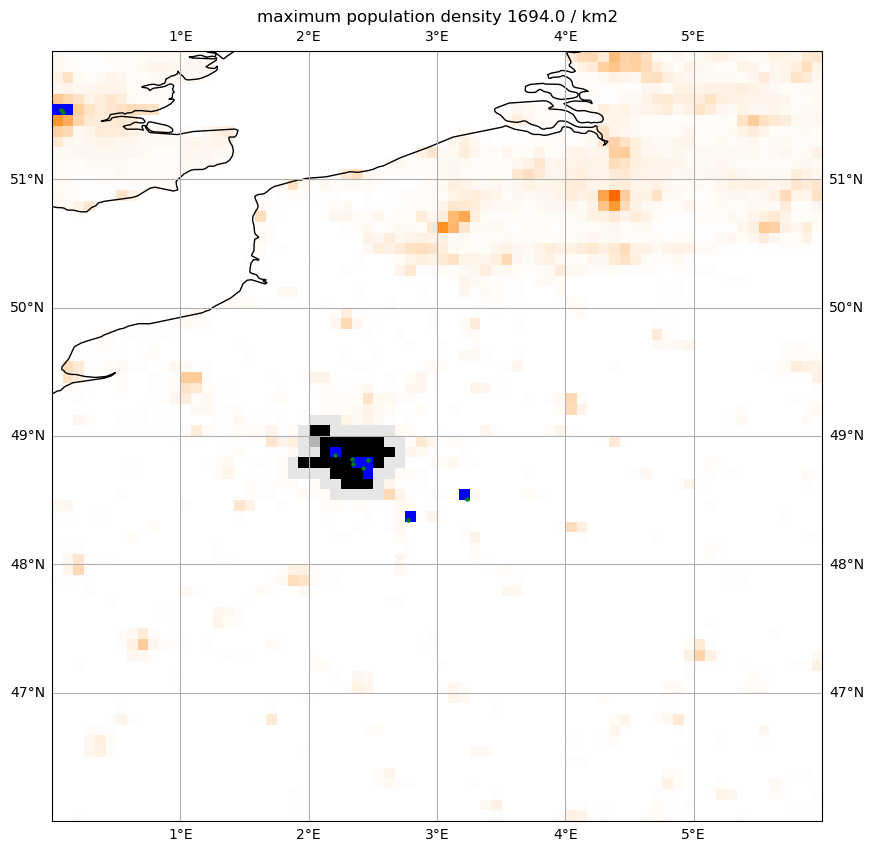

#########################################
explored_pop 8550333.0
true_pop 9737000
coverage 0.8781280681934888
city_mask 30.0
Paris
#########################################


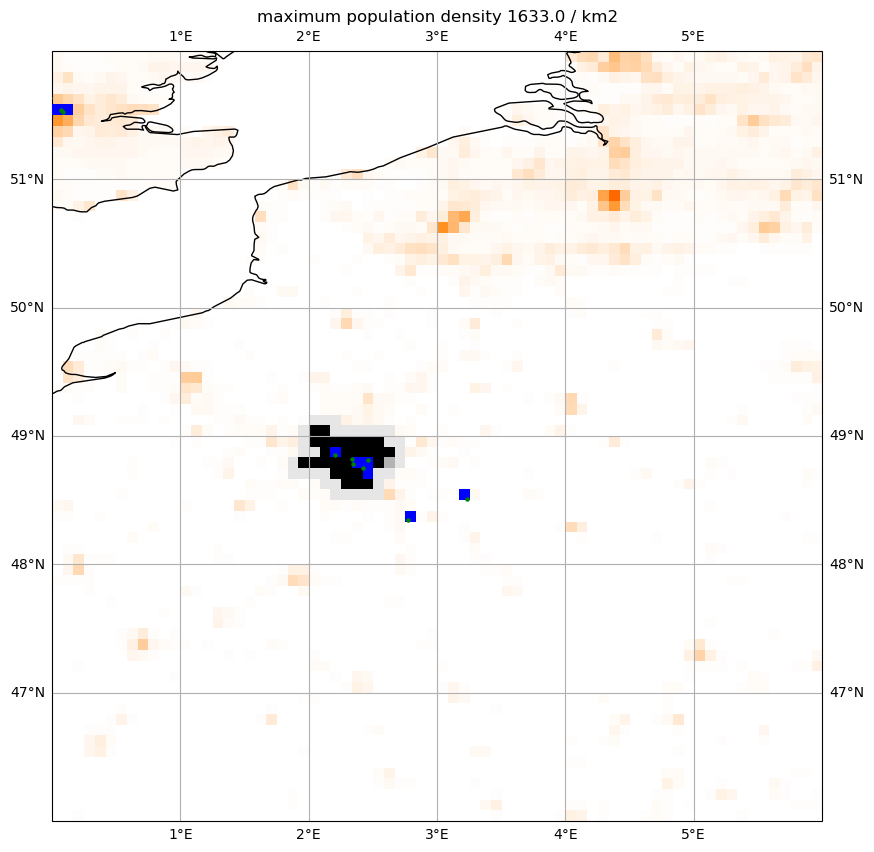

#########################################
explored_pop 8645978.0
true_pop 9737000
coverage 0.8879509089041799
city_mask 31.0
Paris
#########################################


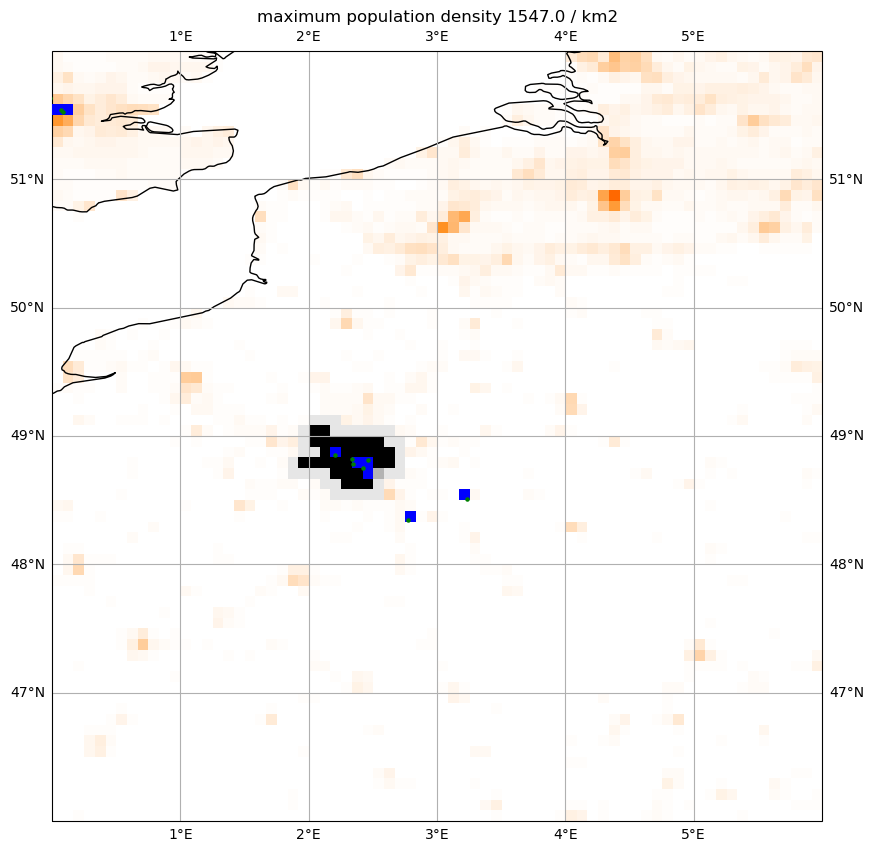

#########################################
explored_pop 8738489.0
true_pop 9737000
coverage 0.8974518845640341
city_mask 32.0
Paris
#########################################


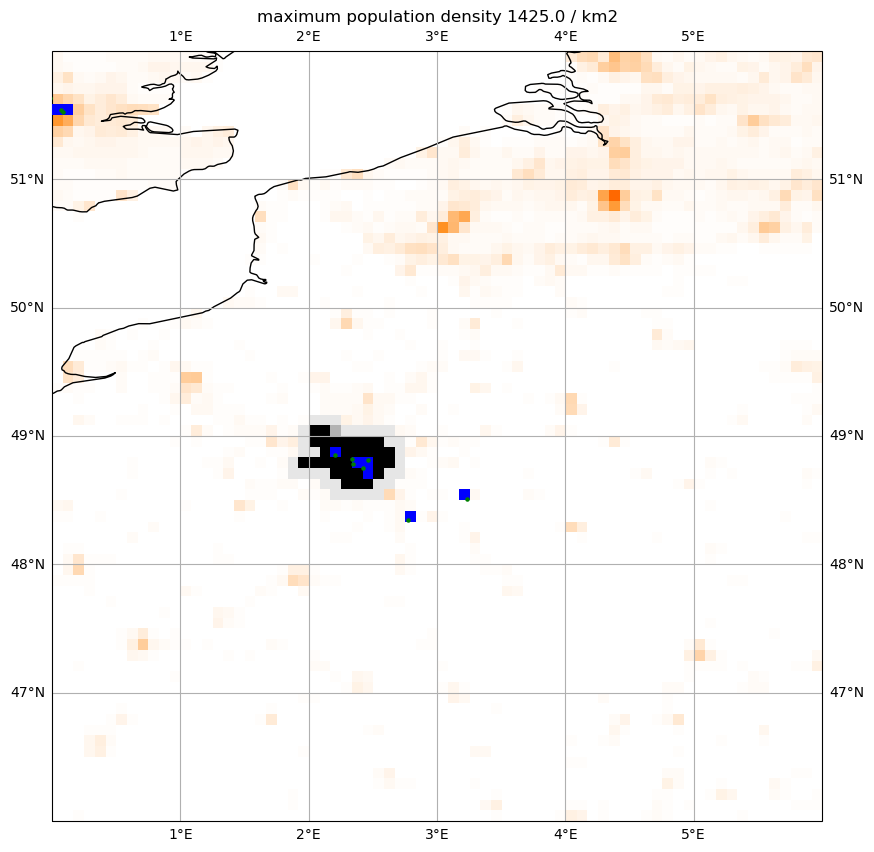

#########################################
explored_pop 8826233.0
true_pop 9737000
coverage 0.9064632843791722
city_mask 33.0
Paris
#########################################


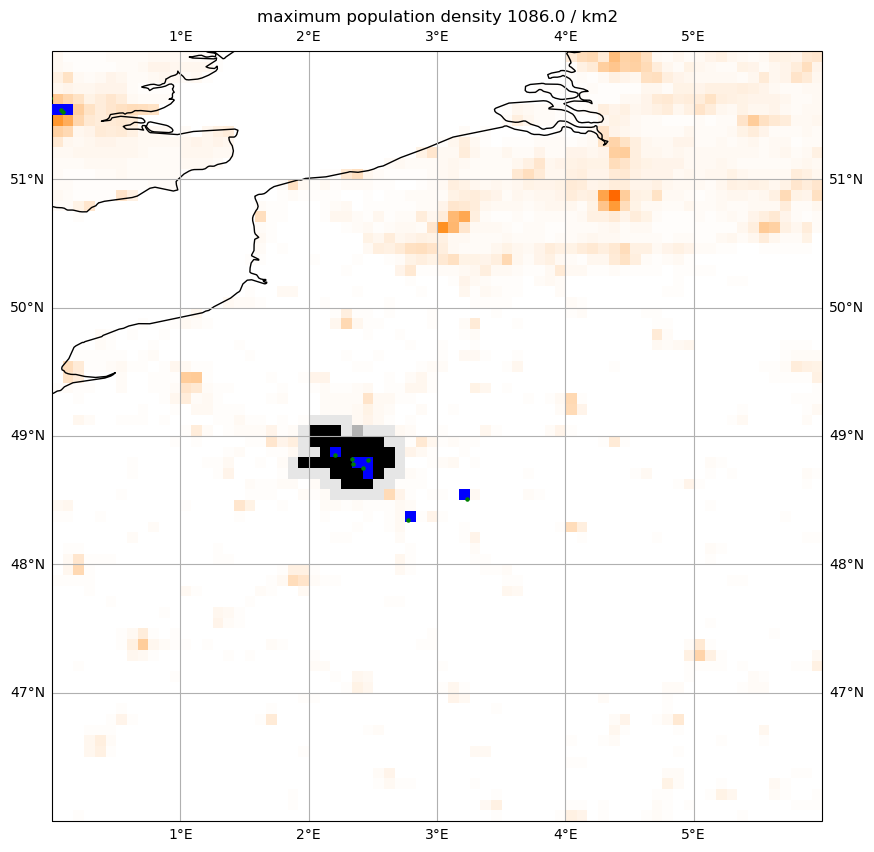

#########################################
explored_pop 8906553.0
true_pop 9737000
coverage 0.9147122316935401
city_mask 34.0
Paris
#########################################


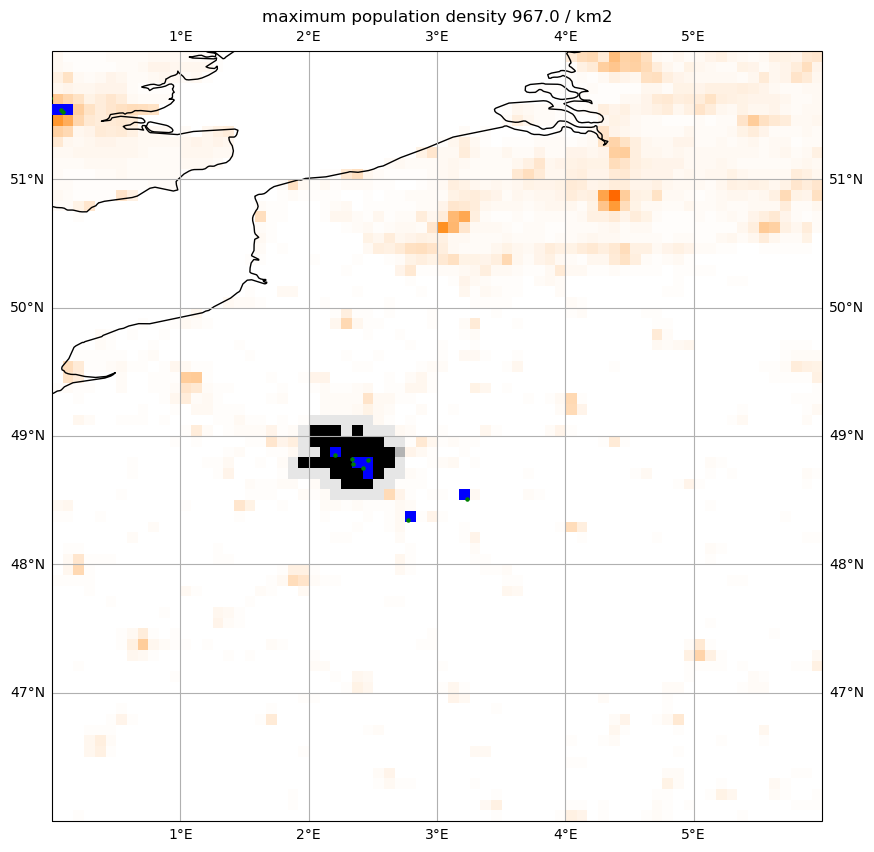

#########################################
explored_pop 8967750.0
true_pop 9737000
coverage 0.9209972270719934
city_mask 35.0
Paris
#########################################


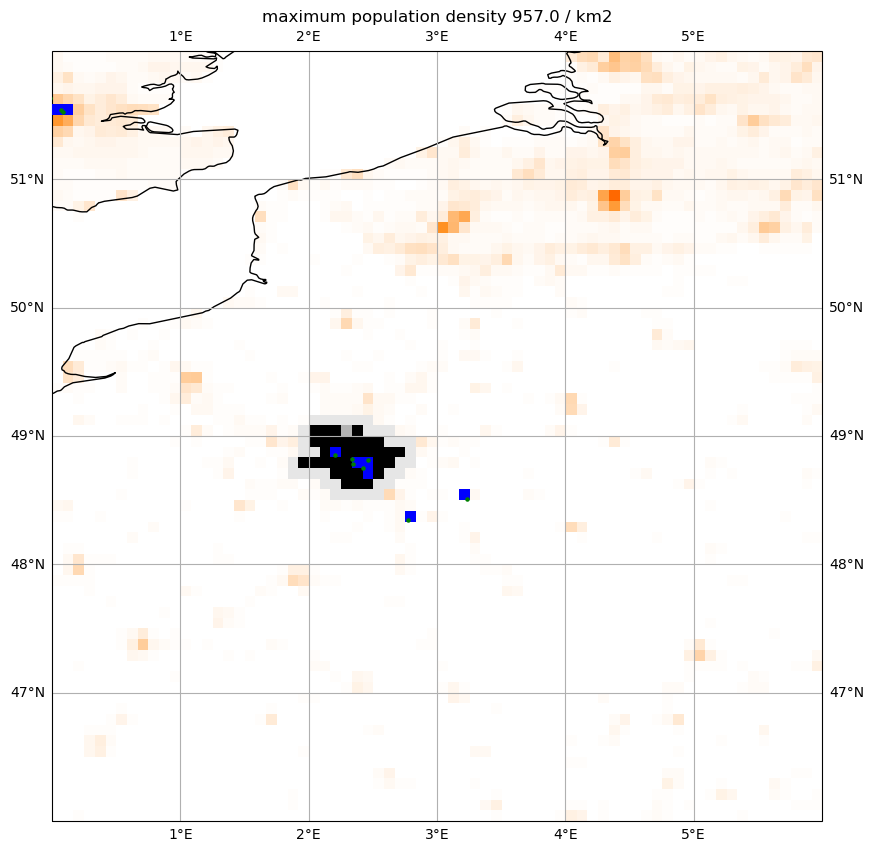

#########################################
explored_pop 9022436.0
true_pop 9737000
coverage 0.9266135359967136
city_mask 36.0
Paris
#########################################


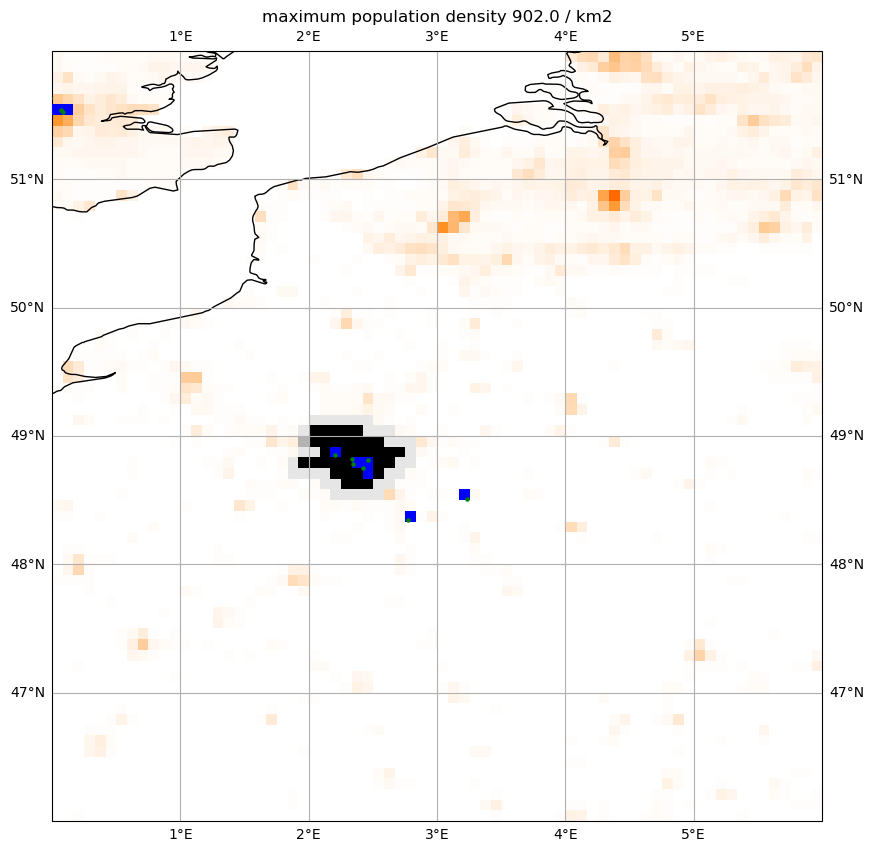

#########################################
explored_pop 9076342.0
true_pop 9737000
coverage 0.9321497381123549
city_mask 37.0
Paris
#########################################


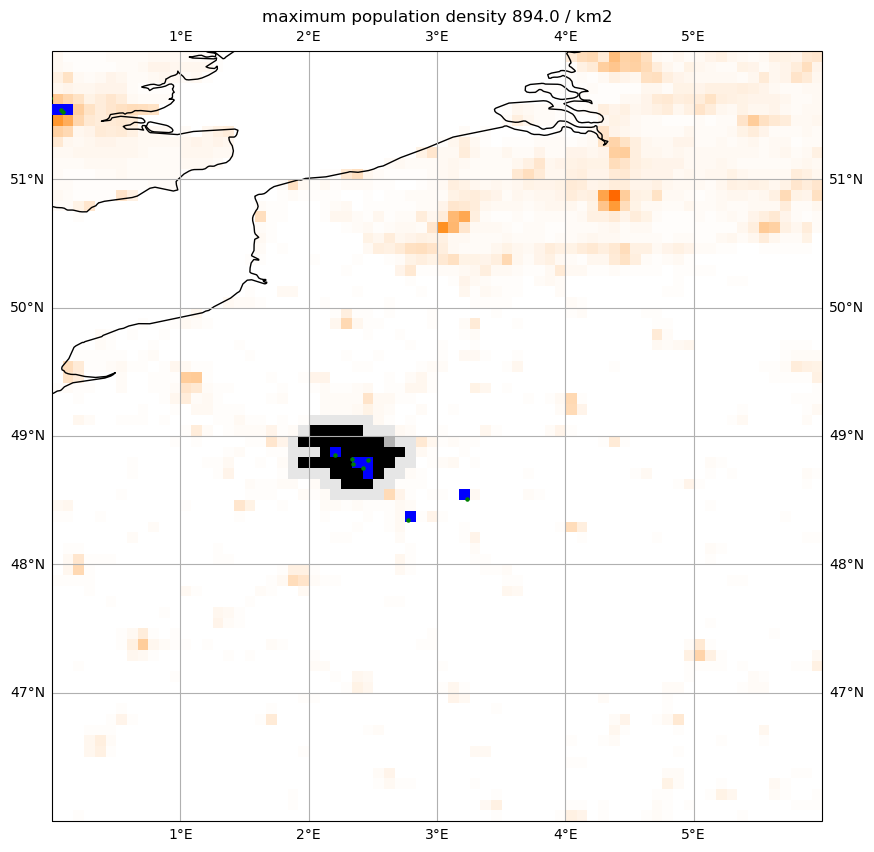

#########################################
explored_pop 9127274.0
true_pop 9737000
coverage 0.9373805073431242
city_mask 38.0
Paris
#########################################


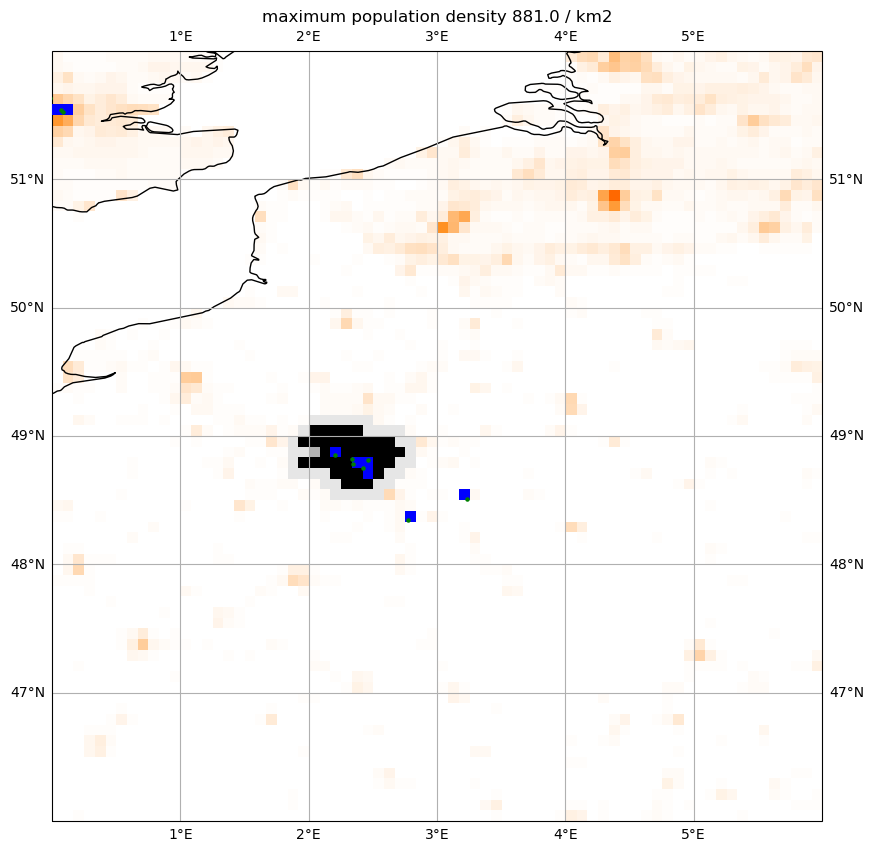

#########################################
explored_pop 9177716.0
true_pop 9737000
coverage 0.9425609530656259
city_mask 39.0
Paris
#########################################


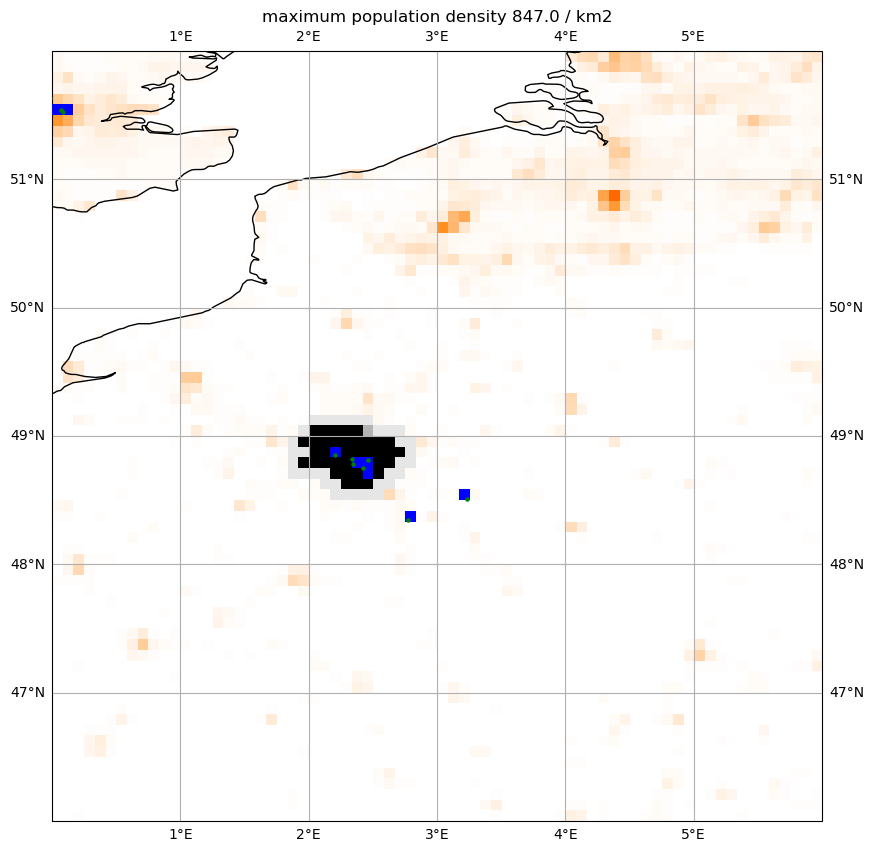

#########################################
explored_pop 9227514.0
true_pop 9737000
coverage 0.9476752593201191
city_mask 40.0
Paris
#########################################


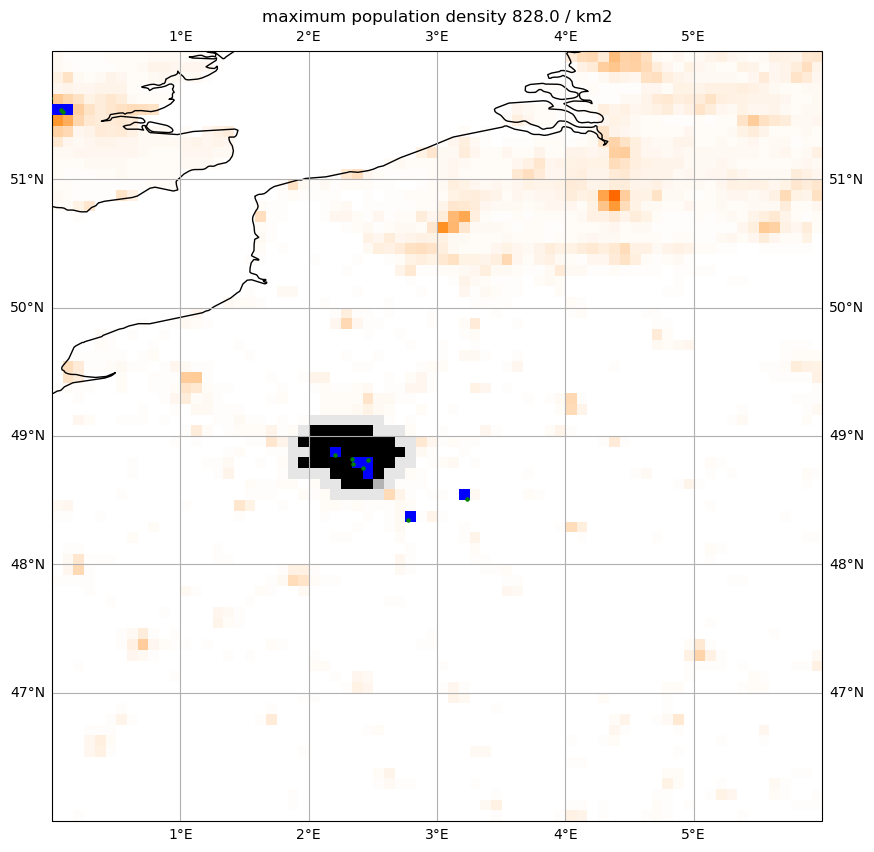

#########################################
explored_pop 9275246.0
true_pop 9737000
coverage 0.9525773852315909
city_mask 41.0
Paris
#########################################


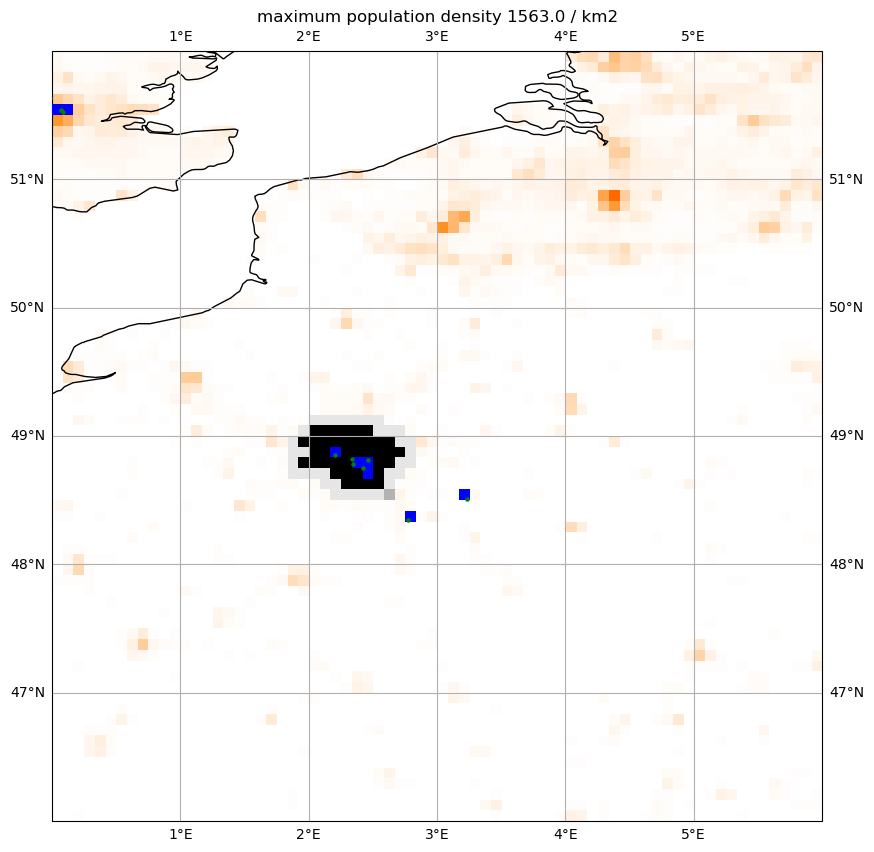

#########################################
explored_pop 9322298.0
true_pop 9737000
coverage 0.9574096744377119
city_mask 42.0
Paris
#########################################


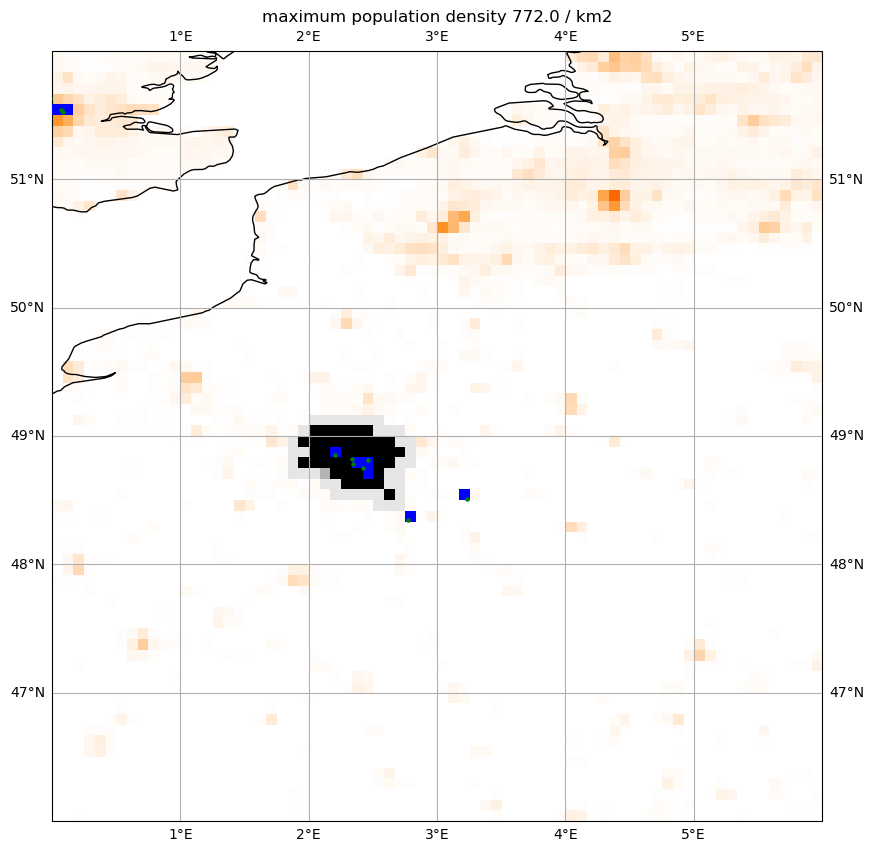

#########################################
explored_pop 9411236.0
true_pop 9737000
coverage 0.9665436992913629
city_mask 43.0
Paris
#########################################


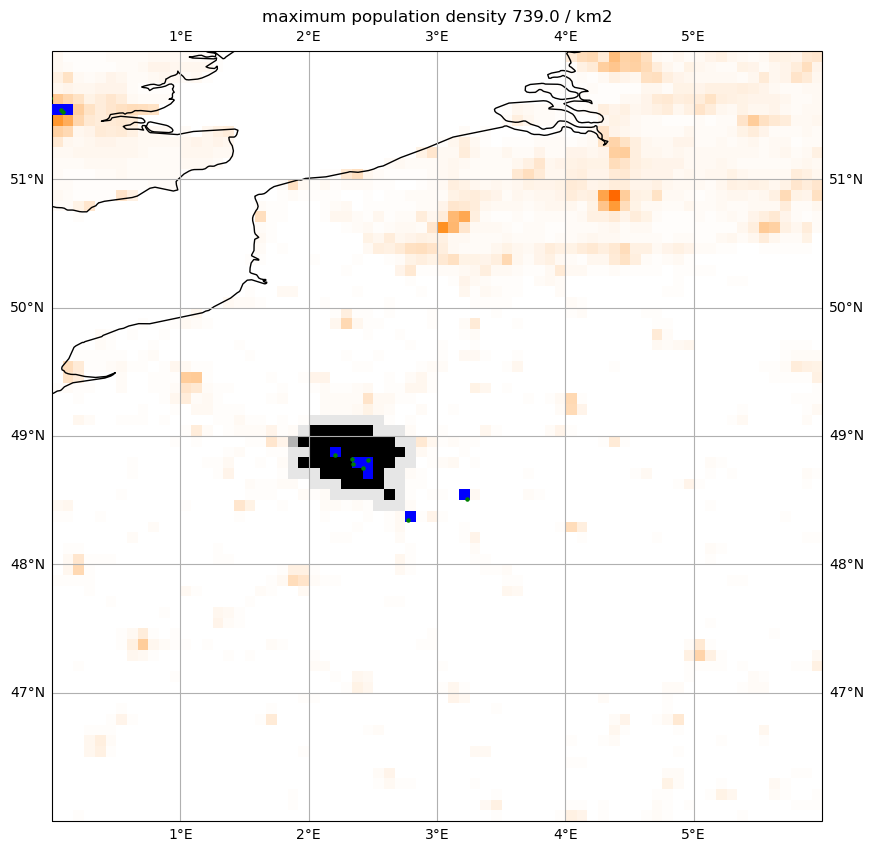

#########################################
explored_pop 9455035.0
true_pop 9737000
coverage 0.9710419020232104
city_mask 44.0
Paris
#########################################


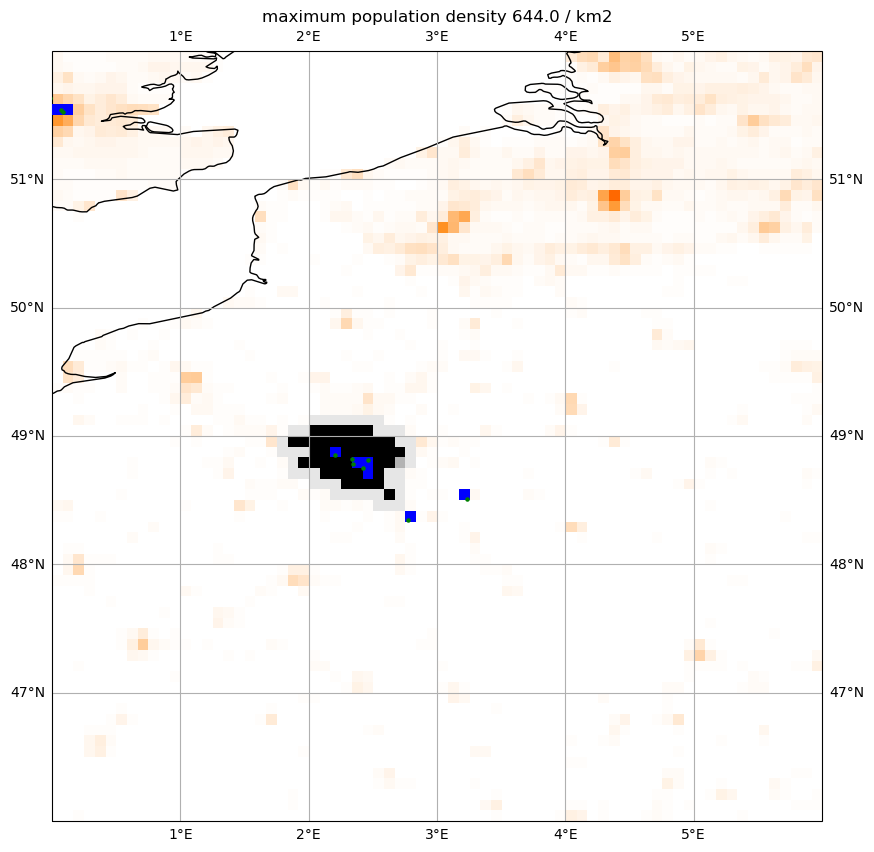

#########################################
explored_pop 9496763.0
true_pop 9737000
coverage 0.9753274109068502
city_mask 45.0
Paris
#########################################


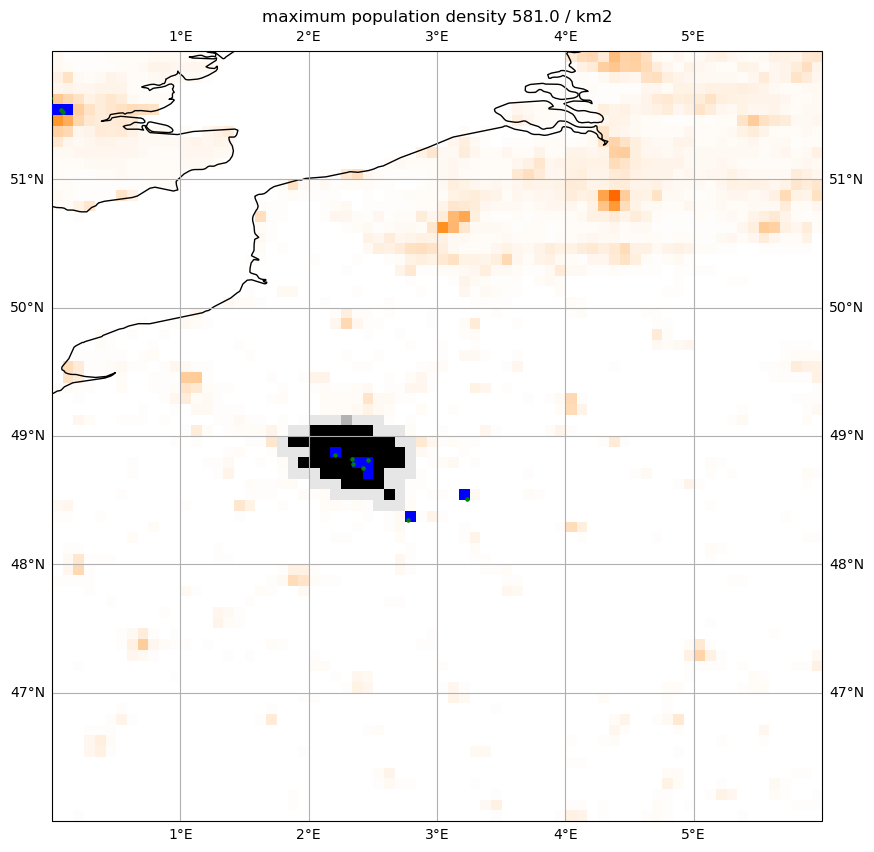

#########################################
explored_pop 9533235.0
true_pop 9737000
coverage 0.9790731231385437
city_mask 46.0
Paris
#########################################


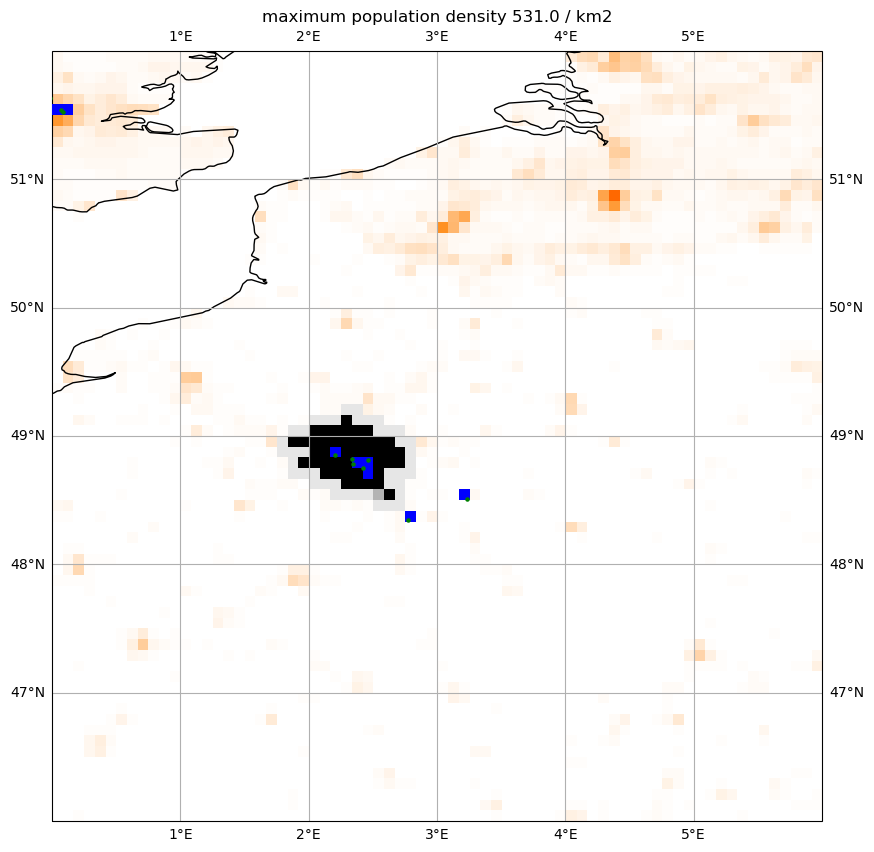

#########################################
explored_pop 9565928.0
true_pop 9737000
coverage 0.9824307281503544
city_mask 47.0
Paris
#########################################


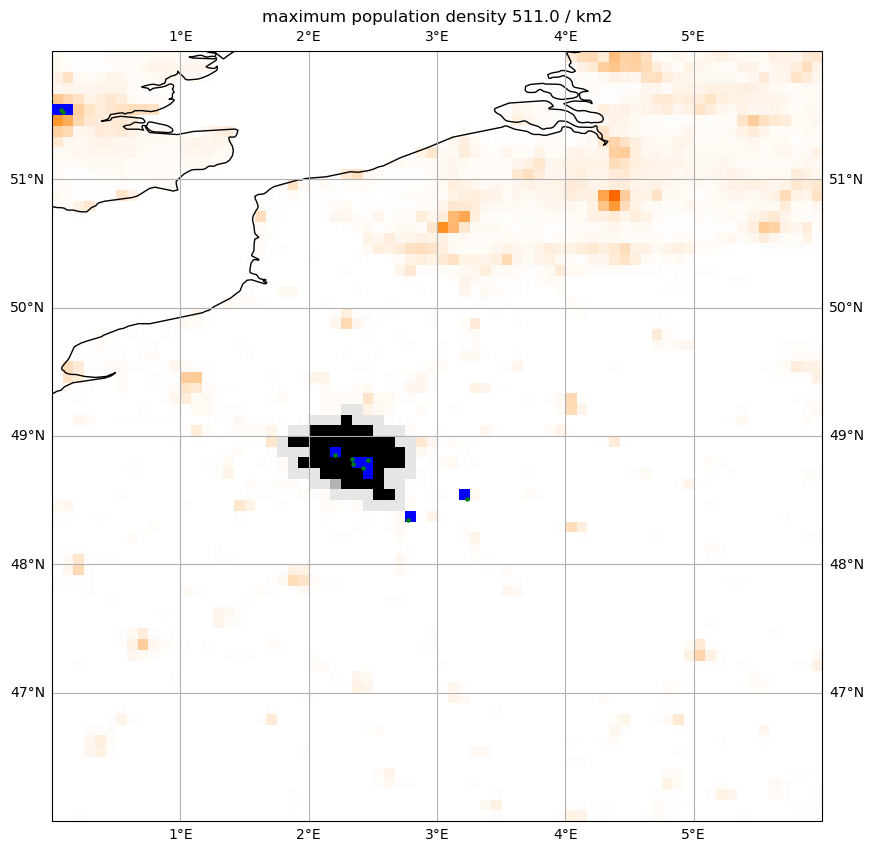

#########################################
explored_pop 9596144.0
true_pop 9737000
coverage 0.9855339426928212
city_mask 48.0
Paris
#########################################


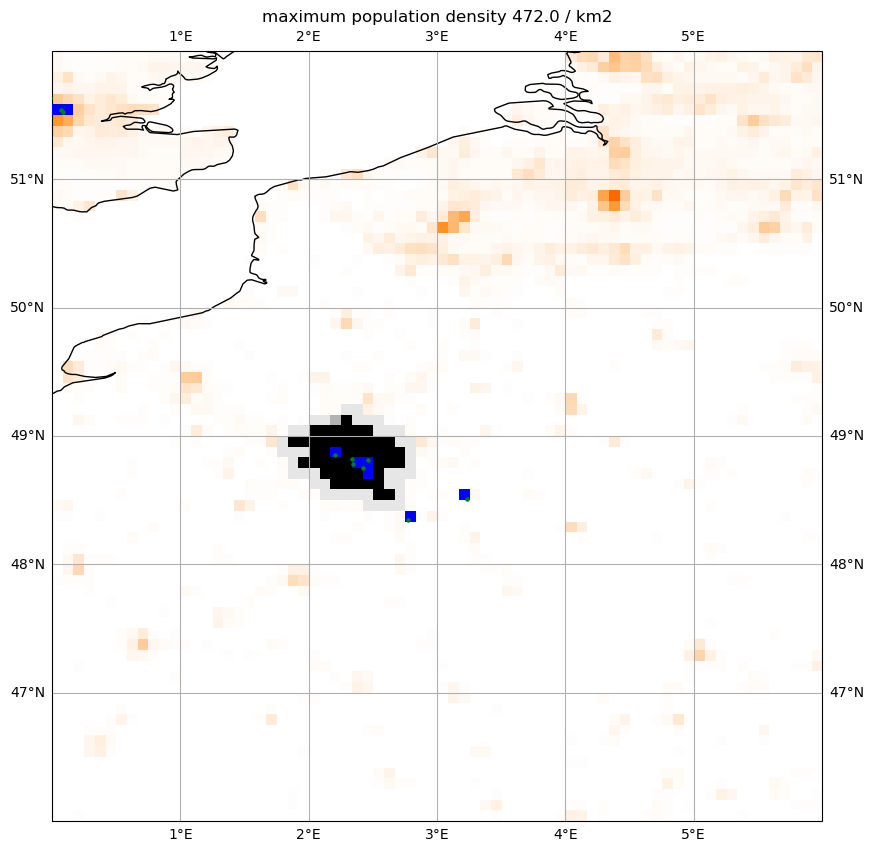

#########################################
explored_pop 9625198.0
true_pop 9737000
coverage 0.9885178186299681
city_mask 49.0
Paris
#########################################


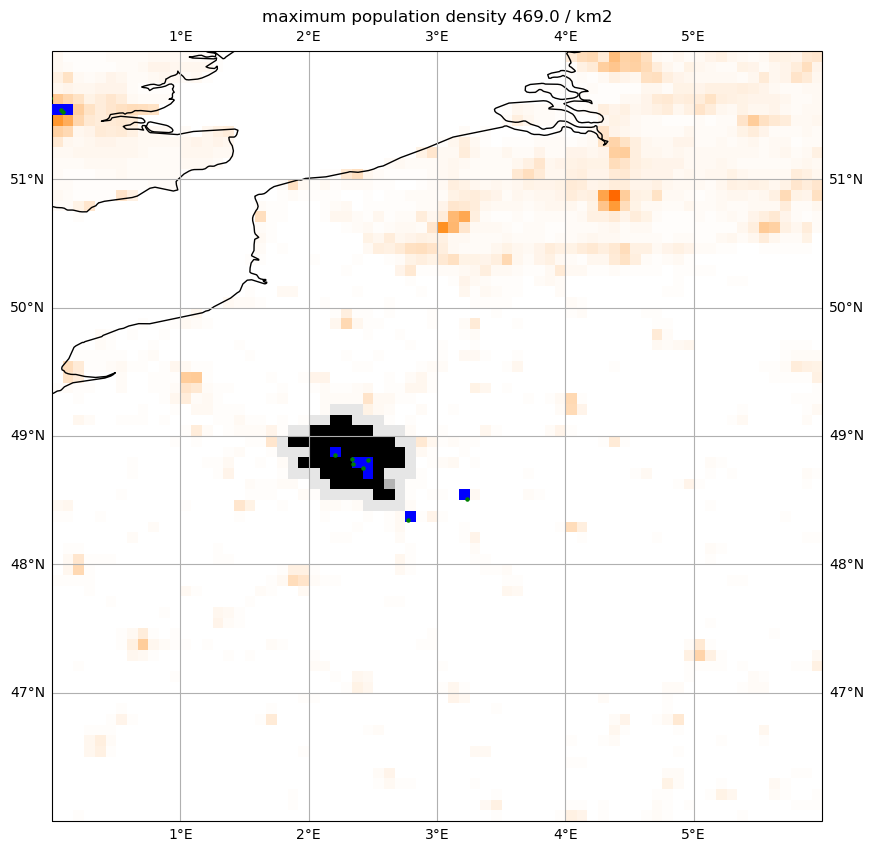

#########################################
explored_pop 9651740.0
true_pop 9737000
coverage 0.9912437095614666
city_mask 50.0
Paris
#########################################


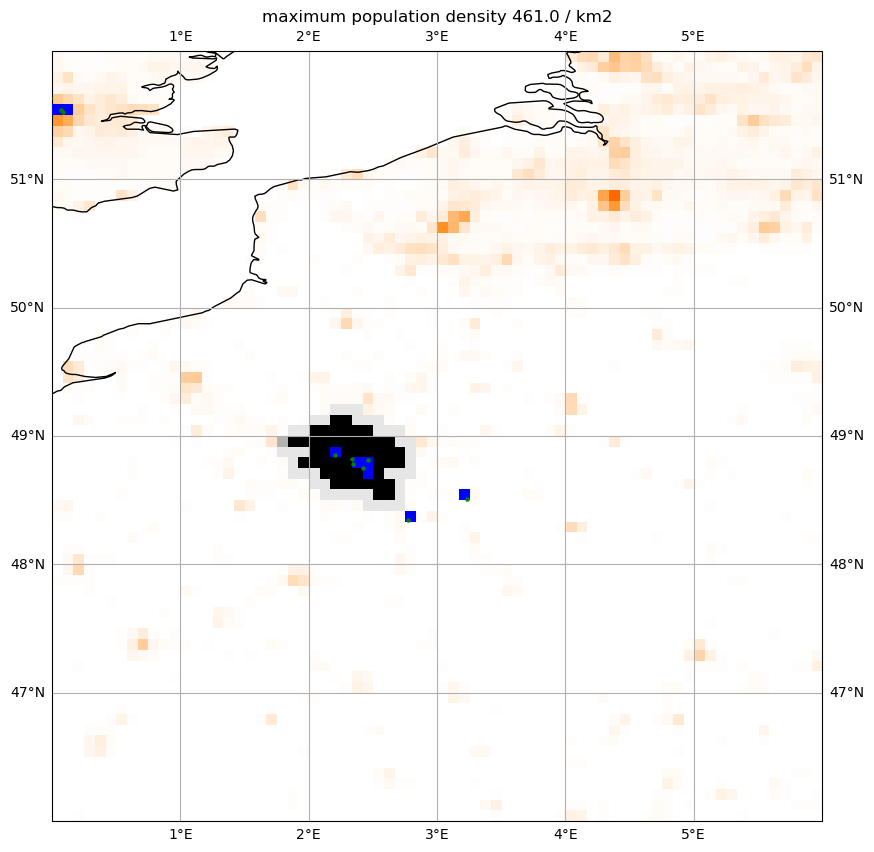

#########################################
explored_pop 9678370.0
true_pop 9737000
coverage 0.9939786381842457
city_mask 51.0
Paris
#########################################


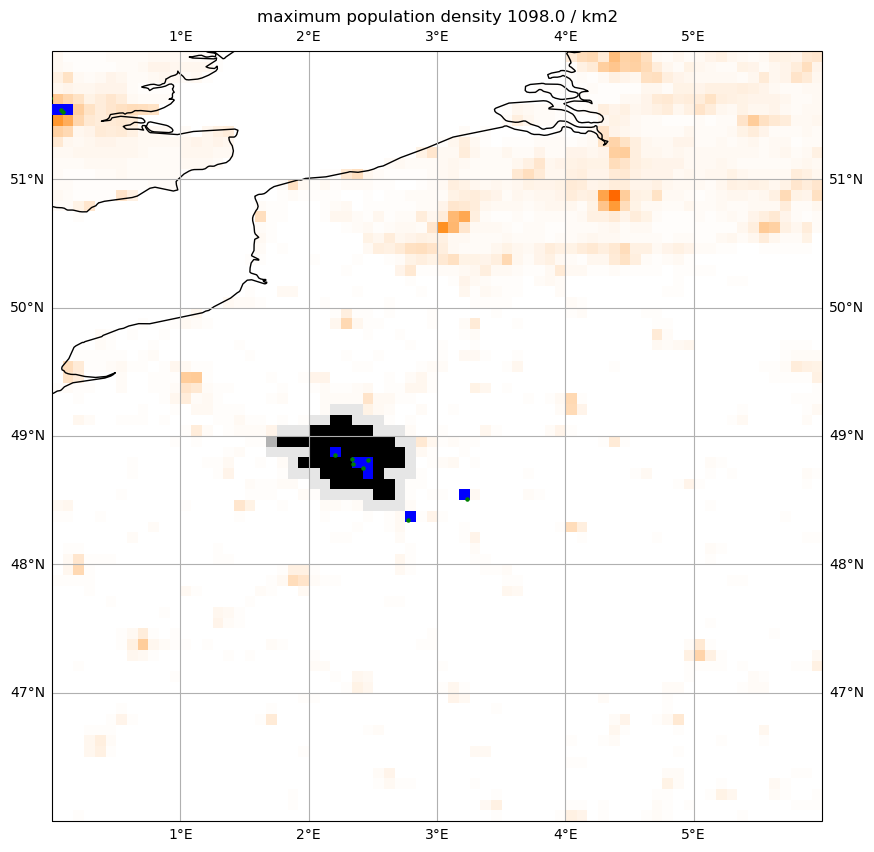

#########################################
explored_pop 9704374.0
true_pop 9737000
coverage 0.9966492759576872
city_mask 52.0
Paris
#########################################


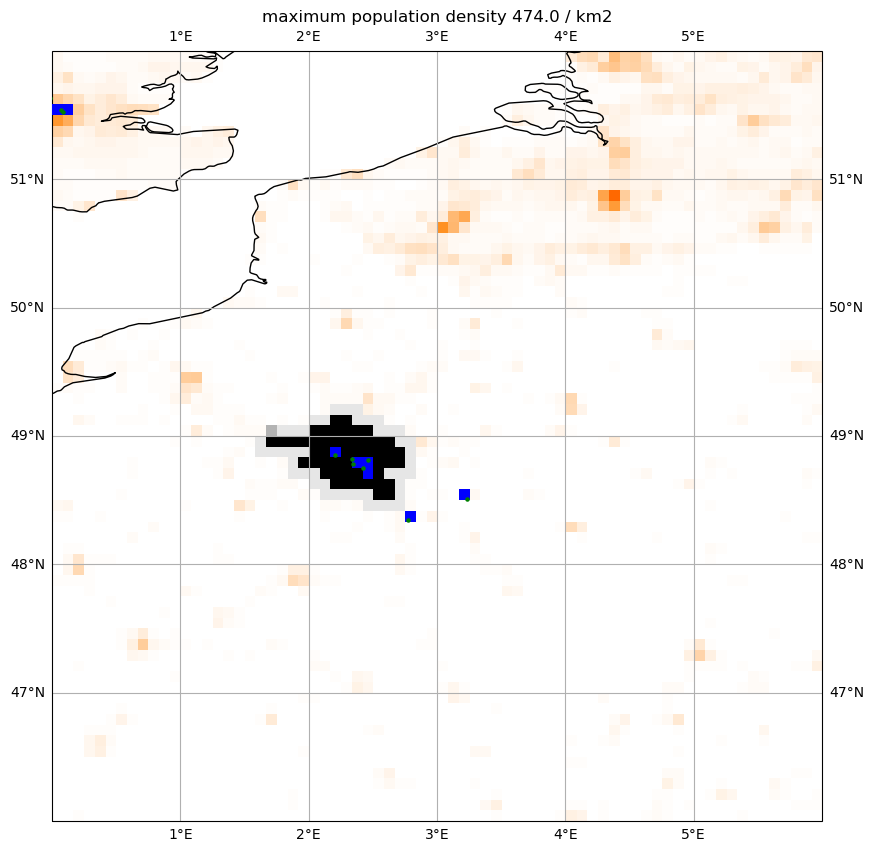

#########################################
explored_pop 9766340.0
true_pop 9737000
coverage 1.0030132484338092
city_mask 53.0
Paris
#########################################


In [454]:
# execute
a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num = geography()
explore_citymask(city_num)
#josui 139.8694531, 35.83236599
#converted 3838, 651
#idial     3838, 649